<div align="center">

# 03 — Analisis Komparatif Arsitektur Deep Learning untuk Deteksi Kerusakan Jalan

Notebook ini menjalankan studi komparatif lima arsitektur deteksi objek berbasis YOLO pada dataset N-RDD2024 subset Asia 6 kelas: **YOLOv8n**, **YOLOv12n**, **YOLOv26n**, **YOLOv8-PD** (rekonstruksi dari Zeng & Zhong, 2024), dan **YOLO-RD** (rekonstruksi dari Wang et al., 2025). Semua model dilatih dengan **Focal Loss** (subclass `v8DetectionLoss`) dan bobot COCO pretrained. Training dijalankan dalam satu loop; tinggal aktifkan atau nonaktifkan entri di `MODELS` sesuai kebutuhan.

</div>

In [1]:
# # Jalankan sekali jika environment belum lengkap.
# # Setelah install selesai, restart kernel agar import library bersih.
# from pathlib import Path

# requirements_file = Path("requirements_yolov8_local.txt")
# if not requirements_file.exists():
#     requirements_file = Path("code/requirements_yolov8_local.txt")

# %pip install -U -r {requirements_file}

# # PENTING: torch/torchvision TIDAK di requirements (agar tidak menarik build CPU dari PyPI).
# # Jika CUDA tidak terdeteksi setelah install, pasang build CUDA secara terpisah:
# #   pip install torch torchvision --index-url https://download.pytorch.org/whl/cu124
# # lalu restart kernel.
# import torch
# print(f"\ntorch: {torch.__version__} | CUDA available: {torch.cuda.is_available()}")
# if not torch.cuda.is_available():
#     print("CUDA TIDAK tersedia. Install torch CUDA dari index PyTorch (lihat komentar di atas), lalu restart kernel.")

In [1]:
import torch
print(f"torch version     : {torch.__version__}")
print(f"torch cuda build  : {torch.version.cuda}")
print(f"CUDA available    : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"Current GPU       : {torch.cuda.get_device_name(0)}")
else:
    print("CUDA tidak tersedia — training akan sangat lambat / gagal untuk 300 epoch.")

torch version     : 2.5.1+cu121
torch cuda build  : 12.1
CUDA available    : True
Current GPU       : NVIDIA GeForce RTX 4070 SUPER


## ***Konfigurasi Global***

---

Satu cell ini berisi seluruh konstanta eksperimen. Ubah di sini, bukan di cell lain.

In [3]:
from pathlib import Path

# ── Reproducibility ──────────────────────────────────────────────────────────
SEED = 42

# ── Smoke test flag ──────────────────────────────────────────────────────────
# True  → 5 epoch, cepat untuk verifikasi pipeline
# False → 300 epoch, eksperimen final
SMOKE_TEST = False

# ── Paths ────────────────────────────────────────────────────────────────────
ROOT_CANDIDATES = [
    Path.cwd().resolve(),
    Path.cwd().resolve().parent,
    Path("D:/01_Akademik/TA-Project"),
]
REPO_ROOT = next(
    (p for p in ROOT_CANDIDATES if (p / "data").exists()),
    Path.cwd().resolve(),
)
DATASET_DIR = (
    REPO_ROOT
    / "data/NRDD-2024/RDD_Split_Final_china_japan_india_6_classes"
    / "RDD_Split_Final_china_japan_india_6_classes"
)
OUTPUT_DIR = REPO_ROOT / "runs/rdd_yolov8n_local"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# ── Training hyperparameters ─────────────────────────────────────────────────
EPOCHS      = 2 if SMOKE_TEST else 300
PATIENCE    = 10 if SMOKE_TEST else 40
IMGSZ       = 640

# ── Focal loss ───────────────────────────────────────────────────────────────
FOCAL_GAMMA = 1.5

# ── Augmentasi ───────────────────────────────────────────────────────────────
MOSAIC       = 1.0
MIXUP        = 0.05
FLIPLR       = 0.5
TRANSLATE    = 0.10
SCALE        = 0.50
DEGREES      = 0.0   # Tidak menggunakan rotasi (arahan metodologi/dospem)
CLOSE_MOSAIC = 10

# ── Evaluasi ─────────────────────────────────────────────────────────────────
EVAL_CONF    = 0.001
EVAL_IOU     = 0.60
PRED_CONF    = 0.25
PRED_IOU     = 0.60

# ── Kelas dataset ────────────────────────────────────────────────────────────
CLASS_NAMES = [
    "Longitudinal_Crack",
    "Transverse_Crack",
    "Alligator_Crack",
    "Pothole",
    "manhole",
    "patchy_road",
]

# ── Daftar model ─────────────────────────────────────────────────────────────
# kind:
#   "pretrained"  → spec adalah nama file .pt di code/ (atau nama yg di-download Ultralytics)
#   "yaml_custom" → spec adalah path yaml relatif terhadap REPO_ROOT
# batch: override batch per model (untuk YAML custom lebih kecil karena modul baru)
# amp:   False untuk yaml_custom (modul belum diverifikasi aman di mixed-precision)
MODELS = [
    # {"name": "yolov8n_class_weight",     "spec": "yolov8n.pt",               "kind": "pretrained",  "batch": 32, "amp": True},
    # {"name": "yolov12n_class_weight",  "spec": "yolo12n.pt",               "kind": "pretrained",  "batch": 16, "amp": True},
    {"name": "yolov26n_class_weight",  "spec": "yolo26n.pt",               "kind": "pretrained",  "batch": 16, "amp": True},
    {"name": "yolov8_pd_class_weight", "spec": "code/models/yolov8-pd.yaml", "kind": "yaml_custom", "batch": 16, "amp": False},
    {"name": "yolo_rd_class_weight",   "spec": "code/models/yolo-rd.yaml",   "kind": "yaml_custom", "batch": 8,  "amp": False},
]

# ── Verifikasi path ──────────────────────────────────────────────────────────
print(f"Repo root   : {REPO_ROOT}")
print(f"Dataset dir : {DATASET_DIR}")
print(f"Output dir  : {OUTPUT_DIR}")
print(f"Smoke test  : {SMOKE_TEST}  →  epochs={EPOCHS}, patience={PATIENCE}")
assert DATASET_DIR.exists(), f"Dataset tidak ditemukan: {DATASET_DIR}"

Repo root   : D:\Faaris\Project-TA\road-damage-detection-ta
Dataset dir : D:\Faaris\Project-TA\road-damage-detection-ta\data\NRDD-2024\RDD_Split_Final_china_japan_india_6_classes\RDD_Split_Final_china_japan_india_6_classes
Output dir  : D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local
Smoke test  : False  →  epochs=300, patience=40


## ***Imports dan Setup Awal***

---

In [4]:
import json
import os
import random
import sys
from collections import Counter

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import yaml
from IPython.display import Image, display

# Seed
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# GPU / CPU
print(f"Torch version       : {torch.__version__}")
print(f"CUDA available      : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device count   : {torch.cuda.device_count()}")
    print(f"Current GPU         : {torch.cuda.get_device_name(0)}")
    DEVICE = 0
    BATCH  = 16   # default; tiap model bisa override via MODELS[i]["batch"]
else:
    print("Training akan berjalan di CPU. Untuk 300 epoch, sangat disarankan memakai GPU.")
    DEVICE = "cpu"
    BATCH  = 4

# Windows notebook lebih stabil dengan workers=0
WORKERS = 0 if os.name == "nt" else 4
print(f"Device untuk YOLO   : {DEVICE}")
print(f"Batch default       : {BATCH}")
print(f"Dataloader workers  : {WORKERS}")

Torch version       : 2.5.1+cu121
CUDA available      : True
CUDA device count   : 1
Current GPU         : NVIDIA GeForce RTX 4070 SUPER
Device untuk YOLO   : 0
Batch default       : 16
Dataloader workers  : 0


## ***Persiapan YAML Lokal***

---

File YAML bawaan dataset memakai `path: .`. Cell ini membuat YAML turunan dengan path absolut dan nama kelas yang konsisten agar notebook berjalan dari direktori mana pun.

In [5]:
original_yaml = DATASET_DIR / "data.yaml"
with original_yaml.open("r", encoding="utf-8") as f:
    data_cfg = yaml.safe_load(f)

data_cfg["path"]  = str(DATASET_DIR.resolve()).replace("\\", "/")
data_cfg["train"] = "train/images"
data_cfg["val"]   = "val/images"
data_cfg["test"]  = "test/images"
data_cfg["nc"]    = len(CLASS_NAMES)
data_cfg["names"] = CLASS_NAMES

local_yaml = OUTPUT_DIR / "rdd6_local.yaml"
with local_yaml.open("w", encoding="utf-8") as f:
    yaml.safe_dump(data_cfg, f, sort_keys=False, allow_unicode=False)

print(local_yaml)
print(local_yaml.read_text(encoding="utf-8"))

D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\rdd6_local.yaml
path: D:/Faaris/Project-TA/road-damage-detection-ta/data/NRDD-2024/RDD_Split_Final_china_japan_india_6_classes/RDD_Split_Final_china_japan_india_6_classes
train: train/images
val: val/images
test: test/images
nc: 6
names:
- Longitudinal_Crack
- Transverse_Crack
- Alligator_Crack
- Pothole
- manhole
- patchy_road



## ***Audit Dataset***

---

Audit jumlah gambar, label, objek, missing label, dan extra label sebelum training. File `classes.txt` di folder labels diabaikan.

In [6]:
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}


def list_images(split: str):
    image_dir = DATASET_DIR / split / "images"
    return sorted([p for p in image_dir.iterdir() if p.suffix.lower() in IMG_EXTS])


def list_label_files(split: str):
    label_dir = DATASET_DIR / split / "labels"
    return sorted([p for p in label_dir.glob("*.txt") if p.name.lower() != "classes.txt"])


def read_yolo_labels(label_path):
    rows = []
    for line_no, line in enumerate(
        label_path.read_text(encoding="utf-8", errors="ignore").splitlines(), start=1
    ):
        parts = line.strip().split()
        if not parts:
            continue
        if len(parts) != 5:
            rows.append({"file": label_path.name, "line": line_no, "error": "not_5_columns", "raw": line})
            continue
        cls, x, y, w, h = parts
        try:
            rows.append({
                "file": label_path.name,
                "class_id": int(float(cls)),
                "x": float(x), "y": float(y), "w": float(w), "h": float(h),
            })
        except ValueError:
            rows.append({"file": label_path.name, "line": line_no, "error": "parse_error", "raw": line})
    return rows


summary_rows, label_rows, invalid_rows = [], [], []

for split in ["train", "val", "test"]:
    images = list_images(split)
    labels = list_label_files(split)
    image_stems = {p.stem for p in images}
    label_stems = {p.stem for p in labels}

    split_counter = Counter()
    split_objects = 0
    for label_path in labels:
        for row in read_yolo_labels(label_path):
            if "error" in row:
                invalid_rows.append({"split": split, **row})
                continue
            class_id = row["class_id"]
            if class_id < 0 or class_id >= len(CLASS_NAMES):
                invalid_rows.append({"split": split, "file": row["file"], "error": "class_id_out_of_range", "class_id": class_id})
                continue
            if not all(0.0 <= row[k] <= 1.0 for k in ["x", "y", "w", "h"]):
                invalid_rows.append({"split": split, "file": row["file"], "error": "bbox_out_of_0_1_range", **row})
                continue
            split_counter[class_id] += 1
            split_objects += 1
            label_rows.append({"split": split, "class_id": class_id, "class_name": CLASS_NAMES[class_id], **row})

    summary_rows.append({
        "split": split,
        "images": len(images),
        "labels": len(labels),
        "objects": split_objects,
        "missing_label_files": len(image_stems - label_stems),
        "extra_label_files": len(label_stems - image_stems),
    })

summary_df  = pd.DataFrame(summary_rows)
labels_df   = pd.DataFrame(label_rows)
invalid_df  = pd.DataFrame(invalid_rows)

class_df = (
    labels_df.groupby(["split", "class_id", "class_name"])
    .size().rename("objects").reset_index()
)
class_pivot = class_df.pivot_table(
    index=["class_id", "class_name"], columns="split", values="objects", fill_value=0
).reset_index()
for col in ["train", "val", "test"]:
    if col not in class_pivot.columns:
        class_pivot[col] = 0
class_pivot["total"]   = class_pivot[["train", "val", "test"]].sum(axis=1)
class_pivot["percent"] = class_pivot["total"] / class_pivot["total"].sum() * 100

print("Summary split:")
display(summary_df)
print("Distribusi kelas:")
display(class_pivot[["class_id", "class_name", "train", "val", "test", "total", "percent"]])

assert invalid_df.empty, f"Ada label invalid, cek invalid_df: {invalid_df.head()}"
assert (summary_df["missing_label_files"] == 0).all(), "Ada gambar tanpa label."
assert (summary_df["extra_label_files"] == 0).all(), "Ada label tanpa gambar."

class_pivot.to_csv(OUTPUT_DIR / "dataset_class_distribution.csv", index=False)
summary_df.to_csv(OUTPUT_DIR / "dataset_split_summary.csv", index=False)

Summary split:


,split,images,labels,objects,missing_label_files,extra_label_files
0,train,6777,6777,17092,0,0
1,val,1898,1898,4773,0,0
2,test,995,995,2425,0,0


Distribusi kelas:


split,class_id,class_name,train,val,test,total,percent
0,0,Longitudinal_Crack,4555.0,1257.0,635.0,6447.0,26.541787
1,1,Transverse_Crack,3219.0,897.0,446.0,4562.0,18.781392
2,2,Alligator_Crack,4385.0,1245.0,642.0,6272.0,25.821326
3,3,Pothole,2192.0,597.0,312.0,3101.0,12.766571
4,4,manhole,2270.0,645.0,321.0,3236.0,13.322355
5,5,patchy_road,471.0,132.0,69.0,672.0,2.766571


### ***Visualisasi Distribusi Kelas***

C:\Users\User\AppData\Local\Temp\ipykernel_14688\171794449.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator. Otherwise, ticks may be mislabeled.
  axes[1].set_xticklabels(class_pivot["class_name"], rotation=25, ha="right")


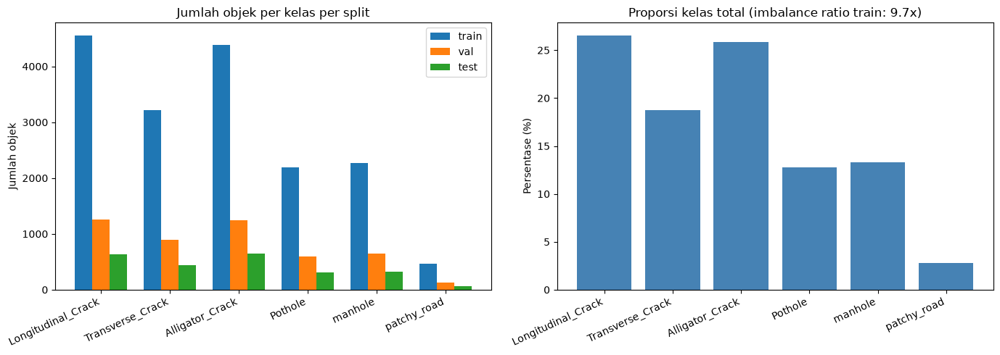

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

splits_plot = ["train", "val", "test"]
x = np.arange(len(CLASS_NAMES))
width = 0.25
for i, split in enumerate(splits_plot):
    axes[0].bar(x + i * width, class_pivot[split], width, label=split)
axes[0].set_xticks(x + width)
axes[0].set_xticklabels(class_pivot["class_name"], rotation=25, ha="right")
axes[0].set_title("Jumlah objek per kelas per split")
axes[0].set_ylabel("Jumlah objek")
axes[0].legend()

max_count = class_pivot["train"].max()
min_count = class_pivot["train"].replace(0, np.nan).min()
imbalance_ratio = max_count / min_count if min_count and min_count > 0 else float("nan")
axes[1].bar(class_pivot["class_name"], class_pivot["percent"], color="steelblue")
axes[1].set_xticklabels(class_pivot["class_name"], rotation=25, ha="right")
axes[1].set_title(f"Proporsi kelas total (imbalance ratio train: {imbalance_ratio:.1f}x)")
axes[1].set_ylabel("Persentase (%)")

plt.tight_layout()
plt.show()

### ***Visualisasi Sampel Label***

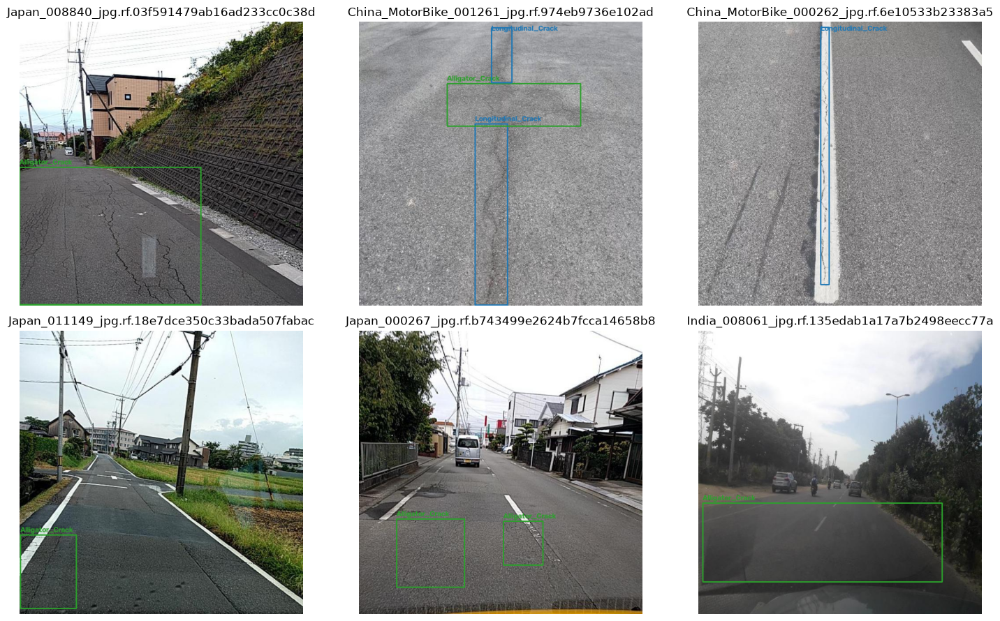

In [8]:
def draw_yolo_boxes(image_path, label_path):
    image = cv2.cvtColor(cv2.imread(str(image_path)), cv2.COLOR_BGR2RGB)
    h_img, w_img = image.shape[:2]
    if not label_path.exists():
        return image
    for row in read_yolo_labels(label_path):
        if "error" in row:
            continue
        cls = int(row["class_id"])
        x, y, w, h = row["x"], row["y"], row["w"], row["h"]
        x1 = int((x - w / 2) * w_img)
        y1 = int((y - h / 2) * h_img)
        x2 = int((x + w / 2) * w_img)
        y2 = int((y + h / 2) * h_img)
        color = tuple(int(c * 255) for c in sns.color_palette("tab10", len(CLASS_NAMES))[cls])
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, CLASS_NAMES[cls], (x1, max(20, y1 - 6)), cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2)
    return image


sample_images = random.sample(list_images("train"), k=min(6, len(list_images("train"))))
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
axes = axes.flatten()
for ax, image_path in zip(axes, sample_images):
    label_path = DATASET_DIR / "train/labels" / f"{image_path.stem}.txt"
    ax.imshow(draw_yolo_boxes(image_path, label_path))
    ax.set_title(image_path.name[:45])
    ax.axis("off")
for ax in axes[len(sample_images):]:
    ax.axis("off")
plt.tight_layout()
plt.show()

## ***Training (Loop)***

---

Loop melakukan iterasi pada `MODELS`. Setiap model:
1. Disiapkan dengan Focal Loss (subclass `v8DetectionLoss`, ganti `self.bce` menjadi `FocalLoss`).
2. Untuk `kind == "yaml_custom"`: load arsitektur dari YAML, lalu transfer bobot COCO via `.load("yolov8n.pt")`.
3. Untuk `kind == "pretrained"`: `YOLO(spec)` biasa.
4. Output tersimpan di `runs/rdd_yolov8n_local/experiments/<run_name>/`.

In [9]:
CUSTOM_DIR = REPO_ROOT / "code/models"

HAS_CUSTOM = any(m["kind"] == "yaml_custom" for m in MODELS)
if HAS_CUSTOM:
    sys.path.insert(0, str(CUSTOM_DIR))
    from custom_modules import patch_ultralytics
    patch_ultralytics()
    print("patch_ultralytics() dipanggil — modul custom terdaftar.")


import gc
import yaml
import numpy as np
from pathlib import Path
from collections import Counter
from ultralytics import YOLO
from ultralytics.nn.tasks import DetectionModel
from ultralytics.utils.loss import v8DetectionLoss, E2ELoss
from ultralytics.nn.tasks import DetectionModel


def count_class_instances(data_yaml_path, split="train"):
    """Scan file label YOLO-format (.txt) pada split tertentu, hitung jumlah
    instance per kelas (list sepanjang nc, terurut sesuai data.yaml)."""
    data_yaml_path = Path(data_yaml_path)
    with open(data_yaml_path) as f:
        cfg = yaml.safe_load(f)
    base = Path(cfg.get("path", data_yaml_path.parent))
    if not base.is_absolute():
        base = data_yaml_path.parent / base
    split_val = cfg[split]
    img_dirs = [split_val] if isinstance(split_val, str) else list(split_val)
    nc = cfg["nc"]
    counts = Counter({i: 0 for i in range(nc)})
    for img_dir in img_dirs:
        label_dir_path = Path(str(base / img_dir).replace("images", "labels"))
        for txt_file in label_dir_path.rglob("*.txt"):
            if txt_file.name.lower() == "classes.txt":
                continue
            with open(txt_file) as f:
                for line in f:
                    line = line.strip()
                    if line:
                        counts[int(line.split()[0])] += 1
    return [counts[i] for i in range(nc)]


def effective_number_weights(counts, beta=0.999):
    """Class-Balanced weighting via Effective Number of Samples.
    Cui, Y., Jia, M., Lin, T-Y., Song, Y., & Belongie, S. (2019).
    "Class-Balanced Loss Based on Effective Number of Samples." CVPR 2019.
    https://arxiv.org/abs/1901.05555
    """
    counts_arr = np.clip(np.array(counts, dtype=np.float64), 1, None)
    effective_num = 1.0 - np.power(beta, counts_arr)
    weights = (1.0 - beta) / effective_num
    weights = weights / weights.sum() * len(counts_arr)
    return torch.tensor(weights, dtype=torch.float32)


print("Menghitung distribusi kelas dari dataset training...")
CLASS_COUNTS = count_class_instances(local_yaml, split="train")
CLASS_WEIGHTS = effective_number_weights(CLASS_COUNTS, beta=0.999)
print(f"Jumlah per kelas : {CLASS_COUNTS}")
print(f"Class weights    : {[round(w, 3) for w in CLASS_WEIGHTS.tolist()]}")


def _init_criterion_with_class_weights(self):
    """Patch di level CLASS DetectionModel (bukan instance) -- ini WAJIB,
    karena Ultralytics Trainer membangun ulang objek model dari nol di dalam
    `.train()`, sehingga patch instance-level (mis. `model.model.init_criterion = ...`
    sebelum `.train()`) tidak akan berpengaruh. Berlaku otomatis untuk semua
    model (YOLOv8n, YOLOv8-PD, YOLO-RD -- semua subclass DetectionModel)."""
    if getattr(self, "class_weights", None) is None:
        self.class_weights = CLASS_WEIGHTS.to(next(self.parameters()).device)
    if getattr(self, "end2end", False):
        return E2ELoss(self)
    return v8DetectionLoss(self)

DetectionModel.init_criterion = _init_criterion_with_class_weights

# Verifikasi class_weights benar-benar aktif
_dummy = YOLO("yolov8n.pt")
_dummy.model.train()
_crit = _dummy.model.init_criterion()
assert torch.allclose(_crit.class_weights.cpu(), CLASS_WEIGHTS), "class_weights tidak aktif!"
print(f"Class-balanced weighting terverifikasi aktif (beta=0.999, sumber: Cui et al. CVPR 2019)")
del _dummy, _crit

patch_ultralytics() dipanggil — modul custom terdaftar.
Menghitung distribusi kelas dari dataset training...
Jumlah per kelas : [4555, 3219, 4385, 2192, 2270, 471]
Class weights    : [0.761, 0.784, 0.763, 0.848, 0.84, 2.004]
Class-balanced weighting terverifikasi aktif (beta=0.999, sumber: Cui et al. CVPR 2019)


In [10]:
del model
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    mem_free = torch.cuda.mem_get_info()[0] / 1024**3
    print(f"  GPU VRAM bebas setelah cleanup: {mem_free:.2f} GB")

NameError: name 'model' is not defined

In [11]:
MODELS = [
    # {"name": "yolov8n_class_weight",     "spec": "yolov8n.pt",               "kind": "pretrained",  "batch": 32, "amp": True},
    # {"name": "yolov12n_class_weight",  "spec": "yolo12n.pt",               "kind": "pretrained",  "batch": 16, "amp": True},
    {"name": "yolov26n_class_weight",  "spec": "yolo26n.pt",               "kind": "pretrained",  "batch": 16, "amp": True},
    {"name": "yolov8_pd_class_weight", "spec": "code/models/yolov8-pd.yaml", "kind": "yaml_custom", "batch": 16, "amp": False},
    {"name": "yolo_rd_class_weight",   "spec": "code/models/yolo-rd.yaml",   "kind": "yaml_custom", "batch": 8,  "amp": False},
]

In [12]:
PROJECT_DIR = OUTPUT_DIR / "experiments"
trained_runs = []  # daftar (model_name, run_name) untuk cell evaluasi

for m in MODELS:
    run_name = f"{m['name']}_smoke" if SMOKE_TEST else m["name"]
    print(f"\n{'='*60}")
    print(f"Training: {run_name}")
    print(f"{'='*60}")

    if m["kind"] == "yaml_custom":
        spec_path = REPO_ROOT / m["spec"]
        model = YOLO(str(spec_path), task="detect")
        model.load(str(REPO_ROOT / "code/yolov8n.pt"))
    else:
        # pretrained: coba resolve dari code/ dulu, fallback ke auto-download
        spec_path_local = REPO_ROOT / "code" / m["spec"]
        spec = str(spec_path_local) if spec_path_local.exists() else m["spec"]
        model = YOLO(spec)

    # (Tidak perlu lagi baris `model.model.init_criterion = ...` per-model --
    # sudah ditangani otomatis & konsisten oleh patch class di atas.)

    batch_size = m.get("batch", BATCH)
    amp_flag   = m.get("amp", True)

    model.train(
        data=str(local_yaml),
        epochs=EPOCHS,
        imgsz=IMGSZ,
        batch=16, 
        device=DEVICE,
        workers=WORKERS,
        project=str(PROJECT_DIR),
        name=run_name,
        exist_ok=True,
        seed=SEED,
        deterministic=True,
        optimizer="auto",
        patience=PATIENCE,
        cache=False,
        amp=amp_flag,
        cos_lr=True,
        plots=True,
        save=True,
        save_period=25,
        close_mosaic=CLOSE_MOSAIC,
        mosaic=MOSAIC,
        mixup=MIXUP,
        fliplr=FLIPLR,
        translate=TRANSLATE,
        scale=SCALE,
        degrees=DEGREES,
    )

    trained_runs.append((m["name"], run_name))
    print(f"Selesai: {run_name}")

    # Bebaskan VRAM sebelum model berikutnya
    del model
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        mem_free = torch.cuda.mem_get_info()[0] / 1024**3
        print(f"  GPU VRAM bebas setelah cleanup: {mem_free:.2f} GB")

print("\nSemua model selesai ditraining:", trained_runs)


Training: yolov26n_class_weight
New https://pypi.org/project/ultralytics/8.4.115 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.108  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\rdd6_local.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=300, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, ker

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      1/300      5.63G      3.863      4.097      4.097         27        640: 100% ━━━━━━━━━━━━ 424/424 3.0it/s 2:200.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 3.9it/s 15.4s0.3s
                   all       1898       4772   0.000848     0.0217     0.0003   6.05e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      2/300      5.61G      3.363      3.729      3.793         68        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      2/300      5.65G      2.954      3.349      3.163         32        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:190.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.0it/s 14.8s0.2s
                   all       1898       4772      0.494     0.0714     0.0474     0.0155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      3/300      5.65G      2.632      3.184      2.673         78        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      3/300      5.65G      2.493       2.86      2.563         31        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 3.9it/s 15.4s0.3s
                   all       1898       4772      0.129      0.199     0.0727     0.0234

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      4/300      5.61G      2.215      2.705      2.375         47        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      4/300      5.65G      2.324      2.622      2.359         28        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.0it/s 15.2s0.3s
                   all       1898       4772      0.151      0.185      0.117     0.0417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      5/300      5.61G      2.383      2.387      2.373         55        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      5/300      5.65G      2.205      2.464      2.235         30        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.7s0.2s
                   all       1898       4772      0.332      0.225       0.17     0.0648

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      6/300      5.61G      2.328       2.54      2.218         66        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      6/300      5.65G       2.15       2.33      2.159         41        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.252      0.281      0.181      0.067

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      7/300      5.61G       2.18       2.37      2.195         64        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      7/300      5.65G      2.095      2.256      2.102         32        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.318      0.264      0.212     0.0845

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      8/300      5.61G      2.012      2.309      2.148         68        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      8/300      5.65G      2.056      2.209      2.071         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.316      0.289      0.214     0.0884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      9/300      5.61G      2.227        2.2      2.194         69        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      9/300      5.65G      2.034      2.147      2.033         30        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.294      0.307      0.257      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     10/300      5.61G      2.006       2.16      2.045         54        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     10/300      5.65G      1.999      2.103      2.014         28        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.323      0.312      0.252      0.105

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     11/300      5.61G      1.827      2.047      1.949         55        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     11/300      5.65G      1.972      2.057      1.983         49        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.385      0.326      0.286      0.125

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     12/300      5.61G      2.081      1.982      2.059         74        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     12/300      5.65G      1.948      2.032      1.974         34        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.356      0.338      0.272      0.119

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     13/300      5.61G      2.023      1.952      2.001         73        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     13/300      5.65G       1.93      1.994      1.957         63        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.7s0.2s
                   all       1898       4772      0.355      0.351      0.302      0.134

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     14/300      5.61G      1.811        1.9      1.909         73        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     14/300      5.65G      1.909      1.971       1.93         48        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.388      0.364      0.307      0.132

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     15/300      5.61G      1.745      1.888      1.843         62        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     15/300      5.65G      1.895      1.955      1.924         46        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.419      0.365       0.32      0.141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     16/300      5.61G      2.081      2.037      2.141         71        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     16/300      5.65G      1.897      1.926      1.914         41        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.409       0.37      0.329      0.148

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     17/300      5.61G      1.922      2.031      1.951         71        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     17/300      5.65G      1.887      1.908      1.911         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.393      0.364       0.32      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     18/300      5.61G      1.788      1.792      1.882         87        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     18/300      5.65G      1.872      1.898      1.896         43        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.389       0.37      0.324      0.146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     19/300      5.61G       1.97      2.448      2.156         74        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     19/300      5.65G      1.867      1.862       1.88         25        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.401      0.367      0.334      0.151

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     20/300      5.61G      1.729      1.831      1.837         59        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     20/300      5.65G      1.843      1.839      1.858         28        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.392      0.374      0.332      0.146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     21/300      5.61G      1.818      1.883      1.862         66        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     21/300      5.65G      1.837      1.821      1.853         39        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.429      0.418      0.359      0.162

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     22/300      5.61G      1.684      1.883      1.745         52        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     22/300      5.65G      1.831      1.813      1.849         45        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.407      0.404      0.362      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     23/300      5.61G       1.59      1.839      1.766         61        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     23/300      5.65G      1.821      1.787      1.833         38        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.407      0.406      0.353      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     24/300      5.61G      1.928      1.805      1.981         67        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     24/300      5.65G      1.821      1.808      1.839         37        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.414      0.418      0.365      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     25/300      5.61G      1.938       1.95      1.937         94        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     25/300      5.65G      1.819      1.777      1.827         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.433      0.426      0.375      0.166

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     26/300      5.61G      1.783       1.82      1.789         49        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     26/300      5.65G       1.81      1.771      1.821         32        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.438      0.413      0.373      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     27/300      5.61G      1.738      1.621      1.658         64        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     27/300      5.65G      1.807      1.769       1.81         64        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.425      0.425      0.375      0.167

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     28/300      5.61G      1.805      1.554      1.805         66        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     28/300      5.65G      1.806       1.76      1.818         44        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.439      0.415      0.378       0.17

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     29/300      5.61G       1.68      1.552      1.766         68        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     29/300      5.65G      1.794      1.736      1.804         39        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.441      0.417      0.377      0.167

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     30/300      5.61G      1.927      1.684      1.843         78        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     30/300      5.65G      1.785      1.732      1.807         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.414      0.426      0.374      0.165

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     31/300      5.61G      1.837      2.152      1.874         45        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     31/300      5.65G      1.777      1.733      1.795         40        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.426      0.441      0.398      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     32/300      5.61G      1.818      1.529      1.739         88        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     32/300      5.65G      1.779      1.713      1.795         37        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.441      0.422       0.38      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     33/300      5.61G      1.876      1.707      1.923         63        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     33/300      5.65G      1.776      1.712      1.791         52        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.433      0.427      0.381      0.171

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     34/300      5.61G      1.578      1.589      1.698         66        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     34/300      5.65G      1.764      1.673      1.778         42        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.449      0.451      0.395      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     35/300      5.61G      1.768      1.843      1.811         49        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     35/300      5.65G       1.76      1.682      1.777         47        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.426      0.443      0.391      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     36/300      5.61G      1.801      1.657      1.934         59        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     36/300      5.65G      1.752      1.674       1.77         43        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.445      0.449      0.408      0.185

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     37/300      5.61G       1.76      1.598      1.803         54        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     37/300      5.65G      1.755      1.678      1.769         41        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.7s0.2s
                   all       1898       4772      0.425      0.443      0.392      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     38/300      5.61G       1.84       1.97      1.806         64        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     38/300      5.65G      1.749      1.673      1.765         32        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.456      0.434      0.413      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     39/300      5.61G      1.653      1.525      1.802         39        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     39/300      5.65G      1.758      1.667      1.757         42        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.485      0.433      0.416      0.186

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     40/300      5.61G      1.624      1.645      1.748         60        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     40/300      5.65G      1.737       1.63      1.747         29        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.477      0.447      0.418      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     41/300      5.61G      1.714      1.525      1.793         42        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     41/300      5.65G      1.737      1.633      1.749         27        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772       0.45      0.423       0.39      0.178

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     42/300      5.61G      1.838      1.801       1.85         69        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     42/300      5.65G       1.74      1.621      1.748         44        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772       0.46      0.421      0.401      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     43/300      5.61G       1.79      1.662      1.689         71        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     43/300      5.65G      1.735      1.627      1.748         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.433      0.432      0.391      0.181

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     44/300      5.61G      1.627      1.669      1.675         46        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     44/300      5.65G      1.713      1.607      1.736         38        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.472      0.445      0.416       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     45/300      5.61G      1.527      1.985      1.736         50        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     45/300      5.65G      1.728      1.602      1.736         39        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.468      0.475      0.425      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     46/300      5.61G      1.809      1.629      1.705         61        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     46/300      5.65G      1.717      1.604      1.719         39        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.8s0.2s
                   all       1898       4772      0.451      0.429      0.404      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     47/300      5.61G      1.712      1.484      1.825         64        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     47/300      5.65G      1.723      1.596      1.733         30        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.458      0.452      0.416      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     48/300      5.61G       1.98      1.652      1.838         68        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     48/300      5.65G      1.712      1.577      1.724         33        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.445      0.454      0.407      0.188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     49/300      5.61G       1.77      1.653       1.78         72        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     49/300      5.65G      1.709      1.573      1.722         42        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.485      0.453      0.417      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     50/300      5.63G       1.95      1.755      1.864         79        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     50/300      5.67G      1.709      1.583      1.722         28        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.439       0.48      0.426      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     51/300      5.61G      1.635      1.446      1.729         56        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     51/300      5.65G      1.705      1.572      1.716         66        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.468      0.447      0.412      0.193

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     52/300      5.61G      1.731      1.433      1.717         65        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     52/300      5.65G      1.697      1.556      1.707         30        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.447      0.459      0.412       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     53/300      5.61G      1.409      1.182      1.475         56        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     53/300      5.65G      1.696      1.562       1.71         34        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.5s0.3s
                   all       1898       4772      0.455      0.463      0.418      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     54/300      5.61G      1.781      1.487      1.741         65        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     54/300      5.65G      1.697      1.554      1.708         63        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.444      0.458      0.407      0.187

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     55/300      5.61G      1.656      1.634      1.826         56        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     55/300      5.65G      1.689       1.54      1.702         39        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.465      0.469      0.443      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     56/300      5.63G      1.781      1.504      1.616         91        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     56/300      5.67G      1.691      1.551      1.693         46        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.477       0.47      0.436      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     57/300      5.63G      1.905      1.763      1.814         71        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     57/300      5.67G      1.691       1.54      1.692         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.471      0.452      0.436      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     58/300      5.61G      1.651      1.419      1.625         67        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     58/300      5.65G      1.687      1.536      1.695         27        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.455       0.47      0.427      0.195

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     59/300      5.61G      1.672      1.547      1.632         68        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     59/300      5.65G      1.675      1.528       1.69         42        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.463      0.478      0.418      0.188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     60/300      5.61G      1.732      1.656      1.743         51        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     60/300      5.65G      1.671      1.525      1.681         41        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.474      0.464      0.424      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     61/300      5.61G      1.587      1.556      1.662         69        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     61/300      5.65G      1.679      1.507      1.686         47        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.478      0.479      0.438      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     62/300      5.61G      1.551       1.69      1.639         53        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     62/300      5.65G      1.678      1.515       1.68         35        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.462      0.489      0.448      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     63/300      5.61G      1.701      1.503      1.638         68        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     63/300      5.65G      1.693      1.543      1.696         21        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.8s0.3s
                   all       1898       4772      0.472      0.468      0.435      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     64/300      5.61G      1.628      1.415      1.715         67        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     64/300      5.65G      1.668      1.503      1.689         51        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.467      0.478      0.443      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     65/300      5.64G      1.807      1.515      1.793         73        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     65/300      5.67G      1.672       1.52      1.687         49        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.7s0.2s
                   all       1898       4772      0.443       0.47      0.427      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     66/300      5.61G      1.696      1.564      1.714         55        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     66/300      5.65G      1.675      1.513      1.685         42        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.448      0.476      0.427      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     67/300      5.61G       1.76      1.597      1.756         94        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     67/300      5.65G      1.664      1.493      1.669         38        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.449      0.453      0.415      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     68/300      5.61G      1.732      1.451      1.618         70        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     68/300      5.65G      1.667      1.489      1.671         26        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.454      0.471       0.43      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     69/300      5.61G      1.669      1.487      1.591         63        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     69/300      5.65G      1.663      1.486      1.674         42        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.475       0.46      0.434      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     70/300      5.61G      1.734      1.557      1.719         72        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     70/300      5.65G      1.639      1.456      1.654         32        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.471      0.461      0.436      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     71/300      5.61G      1.732      1.403      1.716         76        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     71/300      5.65G      1.654      1.474      1.665         43        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.476       0.48      0.436      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     72/300      5.63G        1.6      1.478      1.561         88        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     72/300      5.67G       1.65      1.471      1.659         48        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.463      0.482      0.433      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     73/300      5.61G       1.53      1.561      1.558         77        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     73/300      5.65G       1.65      1.479      1.659         49        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.469      0.486      0.437      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     74/300      5.61G      1.684      1.506      1.633         76        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     74/300      5.65G      1.652      1.466      1.662         29        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.463      0.486      0.445      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     75/300      5.61G      1.652      1.302      1.604         51        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     75/300      5.65G      1.653      1.474      1.666         38        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.485      0.487      0.443      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     76/300      5.61G      1.658      1.746      1.731         57        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     76/300      5.65G       1.65      1.474      1.664         39        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772       0.47      0.484      0.435      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     77/300      5.61G      1.565      1.258      1.518         74        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     77/300      5.65G      1.636      1.455      1.656         43        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.474      0.488      0.442      0.206

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     78/300      5.61G       1.63      1.382      1.635         72        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     78/300      5.65G      1.645      1.458      1.656         39        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772       0.47      0.475      0.444      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     79/300      5.61G      1.694      1.517       1.68         62        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     79/300      5.65G      1.633      1.434      1.642         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.1s0.2s
                   all       1898       4772      0.478       0.48      0.444       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     80/300      5.61G      1.741       1.43      1.799         54        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     80/300      5.65G      1.636      1.436      1.641         38        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.475      0.483      0.449      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     81/300      5.61G      1.601      1.228      1.503         82        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     81/300      5.65G      1.634      1.441      1.649         34        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772       0.49      0.463      0.442      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     82/300      5.61G      1.625      1.467      1.608         69        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     82/300      5.65G       1.63      1.418      1.642         40        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.481      0.481      0.446      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     83/300      5.61G      1.565      1.329      1.536         73        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     83/300      5.65G      1.637      1.425      1.642         38        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.498      0.479      0.455      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     84/300      5.61G      1.469      1.279      1.441         81        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     84/300      5.65G      1.628      1.418       1.63         32        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.482      0.486       0.45      0.209

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     85/300      5.61G      1.983      1.839      1.921         54        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     85/300      5.65G      1.628      1.431      1.637         21        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.469      0.474      0.441      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     86/300      5.61G      1.881      1.639       1.69         50        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     86/300      5.65G      1.618      1.408      1.633         27        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.489      0.463      0.446      0.208

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     87/300      5.61G      1.621      1.468      1.619         50        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     87/300      5.65G      1.631      1.418      1.641         40        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.498      0.479      0.458      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     88/300      5.61G      1.839      1.563       1.72         84        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     88/300      5.65G      1.638       1.41      1.636         21        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.492      0.481      0.459      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     89/300      5.61G      1.551      1.429      1.649         59        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     89/300      5.65G      1.622      1.412      1.642         35        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.495      0.493      0.463      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     90/300      5.61G      1.697      1.228      1.544         60        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     90/300      5.65G      1.617      1.406      1.629         33        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772        0.5      0.492      0.461      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     91/300      5.61G      1.644      1.554      1.708         61        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     91/300      5.65G      1.619      1.392      1.632         43        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.3s
                   all       1898       4772      0.491        0.5      0.459      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     92/300      5.61G      1.649      1.388      1.549         49        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     92/300      5.65G      1.614      1.395      1.627         55        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.495      0.504      0.459      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     93/300      5.61G      1.718      1.552      1.834         47        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     93/300      5.65G      1.623       1.41      1.634         31        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.497      0.492      0.455      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     94/300      5.61G      1.333      1.294      1.513         71        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     94/300      5.65G      1.613      1.401       1.62         40        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:180.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.492      0.481      0.454      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     95/300      5.61G      1.683      1.581      1.723         57        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     95/300      5.65G      1.608       1.39      1.622         28        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.486      0.486      0.454      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     96/300      5.61G      1.701      1.468      1.605         59        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     96/300      5.65G      1.606      1.389      1.622         33        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.489      0.493       0.46      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     97/300      5.61G      1.744      1.381      1.673         82        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     97/300      5.65G      1.607      1.377      1.618         33        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.493      0.491      0.459      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     98/300      5.61G      1.524      1.203      1.529         61        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     98/300      5.65G      1.607      1.362      1.618         30        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.501      0.495      0.461      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     99/300      5.61G      1.603      1.291      1.612         78        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     99/300      5.65G      1.595      1.362      1.608         44        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.495      0.489      0.458      0.214

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    100/300      5.61G      1.449      1.425      1.496         48        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    100/300      5.65G      1.608      1.373      1.612         33        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.495      0.499      0.459      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    101/300      5.61G      1.526      1.188      1.545         67        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    101/300      5.65G      1.611      1.378      1.618         52        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.497      0.497      0.456      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    102/300      5.61G      1.783      1.648      1.827         88        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    102/300      5.65G      1.588      1.369      1.608         33        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.496      0.496      0.456      0.211

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    103/300      5.61G      1.468      1.277      1.478         84        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    103/300      5.65G      1.603      1.371      1.616         30        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.7s0.2s
                   all       1898       4772      0.497      0.491      0.457      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    104/300      5.61G      1.583      1.109      1.534         60        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    104/300      5.65G      1.585      1.343      1.604         38        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772       0.51      0.484      0.459      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    105/300      5.62G      1.729      1.521      1.662         90        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    105/300      5.66G      1.581      1.344      1.598         37        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.507      0.487      0.461      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    106/300      5.61G      1.586      1.479      1.667         56        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    106/300      5.65G       1.59      1.347        1.6         32        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.502      0.492      0.461      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    107/300      5.61G      1.816      1.769      1.873         58        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    107/300      5.65G      1.589      1.358      1.607         20        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.502      0.486       0.46      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    108/300      5.61G      1.596      1.302      1.619         59        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    108/300      5.65G       1.59      1.338        1.6         49        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.498      0.494      0.462      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    109/300      5.61G      1.828      1.496      1.771         64        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    109/300      5.65G      1.589      1.338      1.601         38        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.504      0.492      0.463      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    110/300      5.61G      1.554      1.277      1.503         99        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    110/300      5.65G      1.582      1.336      1.597         35        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.499       0.49      0.464      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    111/300      5.61G      1.627      1.315      1.632         62        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    111/300      5.65G      1.583      1.325      1.591         42        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.491      0.489      0.462      0.217

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    112/300      5.61G      1.446      1.055      1.439         59        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    112/300      5.65G      1.588      1.339      1.588         22        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.507      0.478      0.463      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    113/300      5.61G      1.368      1.035      1.461         61        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    113/300      5.65G       1.58      1.329      1.589         38        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.504      0.483      0.465      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    114/300      5.61G      1.578      1.272      1.499         62        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    114/300      5.65G      1.574       1.32      1.581         55        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.509      0.482      0.467      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    115/300      5.61G      1.552       1.18      1.469         69        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    115/300      5.65G       1.58      1.324      1.586         34        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.2s
                   all       1898       4772      0.505      0.492       0.47      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    116/300      5.61G      1.541      1.222      1.591         81        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    116/300      5.65G      1.569      1.313      1.577         29        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.502       0.49       0.47      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    117/300      5.61G      1.719      1.336      1.673         49        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    117/300      5.65G      1.578      1.313      1.586         35        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.494      0.498      0.469      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    118/300      5.61G      1.445      1.232      1.419         53        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    118/300      5.65G      1.577      1.323      1.591         37        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772       0.49      0.497      0.468      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    119/300      5.61G      1.468      1.357      1.576         64        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    119/300      5.65G      1.565      1.294      1.579         41        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.489      0.499      0.466      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    120/300      5.63G      1.773      1.655      1.606         86        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    120/300      5.67G      1.576      1.312      1.584         43        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.7s0.2s
                   all       1898       4772       0.49      0.493      0.467      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    121/300      5.61G      1.743      1.556      1.719         95        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    121/300      5.65G      1.571       1.31      1.583         21        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772        0.5      0.486      0.468      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    122/300      5.61G      1.622      1.238      1.547         79        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    122/300      5.65G      1.566      1.288      1.577         44        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.498      0.491      0.468      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    123/300      5.61G      1.641      1.318      1.638         80        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    123/300      5.65G      1.565      1.303      1.577         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.495      0.493      0.469      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    124/300      5.62G      1.299     0.9972      1.486         49        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    124/300      5.65G      1.555        1.3      1.577         46        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.498      0.498       0.47      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    125/300      5.61G      1.703      1.332      1.646         62        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    125/300      5.65G      1.548      1.281      1.562         34        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.498      0.498      0.473       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    126/300      5.61G      1.538      1.199      1.532         81        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    126/300      5.65G      1.559      1.293       1.57         27        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.502      0.497      0.474       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    127/300      5.61G      1.594      1.442      1.591         59        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    127/300      5.65G      1.557      1.289      1.569         44        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.495      0.474      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    128/300      5.61G      1.529      1.294      1.568         48        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    128/300      5.65G      1.555       1.28      1.574         35        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772       0.51      0.492      0.474      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    129/300      5.61G      1.583      1.185      1.613         71        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    129/300      5.65G       1.55       1.29      1.564         28        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.1s0.2s
                   all       1898       4772      0.506      0.495      0.474      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    130/300      5.61G      1.722      1.314      1.654         57        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    130/300      5.65G      1.549      1.272      1.565         41        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.492      0.474      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    131/300      5.61G      1.509       1.45      1.653         52        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    131/300      5.65G      1.531      1.256      1.555         61        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.501      0.495      0.473      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    132/300      5.61G      1.552      1.102      1.432         69        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    132/300      5.65G      1.534      1.256      1.559         34        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.6s0.2s
                   all       1898       4772      0.506      0.496      0.474      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    133/300      5.62G      1.657      1.406      1.678         40        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    133/300      5.65G      1.534      1.273      1.553         34        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.509       0.49      0.473      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    134/300      5.63G      1.579      1.475      1.641         83        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    134/300      5.67G       1.54      1.257      1.559         34        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.7s0.2s
                   all       1898       4772      0.511      0.488      0.474      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    135/300      5.61G      1.496       1.38      1.623         46        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    135/300      5.65G       1.54      1.265      1.563         19        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.507      0.491      0.474      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    136/300      5.61G      1.597      1.176      1.599         71        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    136/300      5.65G      1.525      1.252       1.55         35        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.503      0.495      0.474      0.222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    137/300      5.61G      1.597      1.398      1.571         63        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    137/300      5.65G      1.516      1.249      1.551         26        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.509      0.493      0.474       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    138/300      5.62G      1.238      1.405      1.413         55        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    138/300      5.65G      1.526      1.242      1.542         29        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.507      0.492      0.474      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    139/300      5.61G      1.578      1.269      1.552         74        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    139/300      5.65G      1.529      1.247       1.55         24        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.509       0.49      0.473      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    140/300      5.61G      1.446      1.271      1.536         74        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    140/300      5.65G      1.525      1.241      1.546         63        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.0it/s 14.8s0.2s
                   all       1898       4772       0.51       0.49      0.472       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    141/300      5.61G      1.589      1.235      1.571         92        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    141/300      5.65G       1.51      1.226      1.538         29        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.507      0.496      0.473       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    142/300      5.61G      1.415      1.092      1.476         59        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    142/300      5.65G      1.522      1.232      1.547         41        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.504      0.498      0.473       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    143/300      5.61G       1.51      1.136      1.525         60        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    143/300      5.65G      1.524      1.219      1.541         33        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.498      0.473       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    144/300      5.61G      1.677       1.23      1.643         50        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    144/300      5.65G      1.514      1.227      1.536         42        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.504      0.499      0.474       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    145/300      5.61G      1.311     0.9439      1.342         64        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    145/300      5.65G      1.513      1.233      1.542         33        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.507        0.5      0.474       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    146/300      5.61G      1.404      1.002      1.391         71        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    146/300      5.65G      1.519      1.226      1.542         41        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.504      0.501      0.474       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    147/300      5.61G      1.507      1.172      1.583         73        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    147/300      5.65G      1.506      1.215      1.538         27        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.503      0.502      0.474       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    148/300      5.63G      1.714      1.511      1.762         62        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    148/300      5.67G      1.506      1.213      1.531         22        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.496      0.473       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    149/300      5.61G      1.416      1.232      1.479         61        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    149/300      5.65G       1.49      1.193      1.521         44        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.502      0.499      0.473       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    150/300      5.61G      1.527      1.239      1.529         47        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    150/300      5.65G      1.502      1.212      1.525         46        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772       0.51      0.493      0.474       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    151/300      5.61G      1.559      1.366        1.6         87        640: 0% ──────────── 0/424  0.5s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    151/300      5.65G        1.5      1.208      1.529         39        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.509      0.491      0.472       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    152/300      5.61G      1.442      1.051      1.471         69        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    152/300      5.65G      1.497      1.205      1.529         55        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.1s0.2s
                   all       1898       4772      0.502      0.494      0.471       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    153/300      5.61G      1.341     0.8546      1.455         52        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    153/300      5.65G      1.509      1.216      1.531         39        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.4s0.3s
                   all       1898       4772      0.505      0.492      0.472       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    154/300      5.61G      1.412      1.173       1.37         97        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    154/300      5.65G      1.502      1.206      1.522         40        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.1s0.2s
                   all       1898       4772      0.505      0.489      0.471       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    155/300      5.61G        1.5      1.361      1.589         85        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    155/300      5.65G      1.487      1.191       1.52         47        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.1s0.2s
                   all       1898       4772      0.506      0.486      0.471       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    156/300      5.63G       1.74       1.45      1.581         68        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    156/300      5.67G      1.493      1.194      1.521         45        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.506      0.487      0.471       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    157/300      5.61G      1.524      1.328      1.565         55        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    157/300      5.65G      1.491      1.179      1.519         35        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.486      0.471       0.22

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    158/300      5.61G      1.818      1.486      1.725         63        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    158/300      5.65G      1.487      1.181      1.517         32        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.505      0.486      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    159/300      5.61G      1.725      1.259      1.642         60        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    159/300      5.65G      1.482      1.172      1.512         34        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.511      0.483      0.472      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    160/300      5.61G      1.381      1.128      1.399         72        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    160/300      5.65G       1.48       1.18      1.516         47        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.507      0.482      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    161/300      5.61G        1.5      1.082      1.534         39        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    161/300      5.65G      1.478      1.168       1.51         49        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.483      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    162/300      5.61G      1.368       1.09      1.466         47        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    162/300      5.65G      1.472      1.175      1.504         33        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.1s0.2s
                   all       1898       4772      0.504      0.484      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    163/300      5.61G      1.512       1.26      1.458         69        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    163/300      5.65G      1.472      1.167      1.498         45        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.2s
                   all       1898       4772      0.506      0.483      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    164/300      5.61G      1.461      1.147      1.438         63        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    164/300      5.65G      1.476      1.161      1.506         28        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.507      0.481      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    165/300      5.61G       1.62      1.359      1.593         56        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    165/300      5.65G      1.466      1.146      1.493         29        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.1it/s 14.5s0.3s
                   all       1898       4772      0.505      0.483      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    166/300      5.61G      1.487      1.138      1.542         67        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    166/300      5.65G      1.467      1.159      1.498         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.505      0.484      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    167/300      5.61G      1.356      1.062      1.518         69        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    167/300      5.65G      1.467      1.148      1.492         36        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.504      0.484      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    168/300      5.61G      1.445      1.016      1.447         81        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    168/300      5.65G      1.451      1.135      1.482         32        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:170.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.1s0.2s
                   all       1898       4772      0.503      0.487      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    169/300      5.61G      1.417      1.097      1.415         94        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    169/300      5.65G      1.458      1.146       1.49         28        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.503      0.487      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    170/300      5.61G      1.699      1.239      1.579         72        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    170/300      5.65G      1.457      1.138      1.487         57        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.3s0.2s
                   all       1898       4772      0.504      0.485      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    171/300      5.61G      1.455      1.027      1.466         84        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    171/300      5.65G      1.452      1.128      1.484         26        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.485      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    172/300      5.61G      1.505      1.339      1.467         62        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    172/300      5.65G      1.461      1.124      1.486         29        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.486      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    173/300      5.61G       1.81      1.208      1.702         58        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    173/300      5.65G      1.444      1.127      1.477         52        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:160.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.486      0.471      0.221

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
    174/300      5.61G        1.5      1.007      1.452         68        640: 0% ──────────── 0/424  0.4s

d:\Faaris\Project-TA\road-damage-detection-ta\.venv\Lib\site-packages\torch\autograd\graph.py:825: UserWarning: compute_grad_input does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\Context.cpp:95.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    174/300      5.65G      1.466      1.133      1.491         28        640: 100% ━━━━━━━━━━━━ 424/424 3.1it/s 2:150.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 60/60 4.2it/s 14.2s0.2s
                   all       1898       4772      0.506      0.487       0.47      0.221
EarlyStopping: Training stopped early as no improvement observed in last 40 epochs. Best results observed at epoch 134, best model saved as best.pt.
To update EarlyStopping(patience=40) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

174 epochs completed in 7.323 hours.
Optimizer stripped from D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\experiments\yolo_rd_class_weight\weights\last.pt, 14.6MB
Optimizer stripped from D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\experiments\yolo_rd_class_weight\weights\best.pt, 14.6MB

Validating D:\Faaris\Project-TA\road-d

In [ ]:
# CUSTOM_DIR = REPO_ROOT / "code/models"

# HAS_CUSTOM = any(m["kind"] == "yaml_custom" for m in MODELS)
# if HAS_CUSTOM:
#     sys.path.insert(0, str(CUSTOM_DIR))
#     from custom_modules import patch_ultralytics
#     patch_ultralytics()
#     print("patch_ultralytics() dipanggil — modul custom terdaftar.")


# import gc
# from ultralytics import YOLO
# from ultralytics.utils.loss import FocalLoss, v8DetectionLoss


# class FocalDetectionLoss(v8DetectionLoss):
#     """v8DetectionLoss dengan self.bce diganti FocalLoss.

#     Ultralytics >= 8.4.108 selalu memakai BCE di v8DetectionLoss.
#     fl_gamma bukan parameter publik yang stabil, sehingga subclass ini
#     adalah satu-satunya cara yang terverifikasi untuk mengaktifkan Focal Loss
#     di YOLOv8n, YOLOv8-PD, maupun YOLO-RD.
#     """

#     def __init__(self, model, tal_topk=10):
#         super().__init__(model, tal_topk=tal_topk)
#         self.bce = FocalLoss(gamma=FOCAL_GAMMA)


# # Verifikasi FocalDetectionLoss aktif
# _dummy = YOLO("yolov8n.pt")
# _loss  = FocalDetectionLoss(_dummy.model)
# assert isinstance(_loss.bce, FocalLoss), "FocalLoss tidak aktif!"
# print(f"Focal Loss terverifikasi aktif  (gamma={FOCAL_GAMMA}, bce={type(_loss.bce).__name__})")
# del _dummy, _loss

# PROJECT_DIR = OUTPUT_DIR / "experiments"
# trained_runs = []  # daftar (model_name, run_name) untuk cell evaluasi

# for m in MODELS:
#     run_name = f"{m['name']}_smoke" if SMOKE_TEST else m["name"]
#     print(f"\n{'='*60}")
#     print(f"Training: {run_name}")
#     print(f"{'='*60}")

#     if m["kind"] == "yaml_custom":
#         spec_path = REPO_ROOT / m["spec"]
#         model = YOLO(str(spec_path), task="detect")
#         model.load(str(REPO_ROOT / "code/yolov8n.pt"))
#     else:
#         # pretrained: coba resolve dari code/ dulu, fallback ke auto-download
#         spec_path_local = REPO_ROOT / "code" / m["spec"]
#         spec = str(spec_path_local) if spec_path_local.exists() else m["spec"]
#         model = YOLO(spec)

#     # Pasang Focal Loss
#     model.model.init_criterion = lambda _m=model.model: FocalDetectionLoss(_m)

#     batch_size = m.get("batch", BATCH)
#     amp_flag   = m.get("amp", True)

#     model.train(
#         data=str(local_yaml),
#         epochs=EPOCHS,
#         imgsz=IMGSZ,
#         batch=batch_size,
#         device=DEVICE,
#         workers=WORKERS,
#         project=str(PROJECT_DIR),
#         name=run_name,
#         exist_ok=True,
#         seed=SEED,
#         deterministic=True,
#         optimizer="auto",
#         patience=PATIENCE,
#         cache=False,
#         amp=amp_flag,
#         cos_lr=True,
#         plots=True,
#         save=True,
#         save_period=25,
#         close_mosaic=CLOSE_MOSAIC,
#         mosaic=MOSAIC,
#         mixup=MIXUP,
#         fliplr=FLIPLR,
#         translate=TRANSLATE,
#         scale=SCALE,
#         degrees=DEGREES,
#     )

#     trained_runs.append((m["name"], run_name))
#     print(f"Selesai: {run_name}")

#     # Bebaskan VRAM sebelum model berikutnya
#     del model
#     gc.collect()
#     if torch.cuda.is_available():
#         torch.cuda.empty_cache()
#         mem_free = torch.cuda.mem_get_info()[0] / 1024**3
#         print(f"  GPU VRAM bebas setelah cleanup: {mem_free:.2f} GB")

# print("\nSemua model selesai ditraining:", trained_runs)

## ***Evaluasi per Model***

---

Evaluasi val dan test untuk setiap model. Output disimpan di `runs/rdd_yolov8n_local/evaluation/` dengan prefix nama model.

In [13]:
# Jika modul custom diperlukan saat load best.pt, patch harus sudah aktif
# (dipanggil di cell training). Jika cell ini dijalankan tanpa training terlebih dahulu,
# panggil patch_ultralytics() di sini jika ada yaml_custom di trained_runs.
if HAS_CUSTOM and "patch_ultralytics" not in dir():
    sys.path.insert(0, str(CUSTOM_DIR))
    from custom_modules import patch_ultralytics
    patch_ultralytics()

EVAL_DIR    = OUTPUT_DIR / "evaluation"
eval_results = {}  # model_name → {"val": metrics, "test": metrics}

for model_name, run_name in trained_runs:
    best_weights = PROJECT_DIR / run_name / "weights/best.pt"
    assert best_weights.exists(), f"best.pt tidak ditemukan: {best_weights}"

    best_model = YOLO(str(best_weights))

    print(f"\nEvaluasi {model_name} — val")
    val_metrics = best_model.val(
        data=str(local_yaml),
        split="val",
        imgsz=IMGSZ,
        batch=BATCH,
        device=DEVICE,
        workers=WORKERS,
        project=str(EVAL_DIR),
        name=f"{model_name}_val",
        exist_ok=True,
        plots=True,
        save_json=True,
        conf=EVAL_CONF,
        iou=EVAL_IOU,
    )

    print(f"\nEvaluasi {model_name} — test")
    test_metrics = best_model.val(
        data=str(local_yaml),
        split="test",
        imgsz=IMGSZ,
        batch=BATCH,
        device=DEVICE,
        workers=WORKERS,
        project=str(EVAL_DIR),
        name=f"{model_name}_test",
        exist_ok=True,
        plots=True,
        save_json=True,
        conf=EVAL_CONF,
        iou=EVAL_IOU,
    )

    eval_results[model_name] = {"val": val_metrics, "test": test_metrics}
    print(f"  val  mAP50: {val_metrics.results_dict.get('metrics/mAP50(B)', float('nan')):.4f}")
    print(f"  test mAP50: {test_metrics.results_dict.get('metrics/mAP50(B)', float('nan')):.4f}")


Evaluasi yolov26n_class_weight — val
Ultralytics 8.4.108  Python-3.12.3 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
YOLO26n summary (fused): 122 layers, 2,376,006 parameters, 0 gradients, 5.2 GFLOPs
WARNING val: Slow image access detected (ping: 0.00.0 ms, read: 13.80.3 MB/s, size: 76.8 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips/
val: Scanning D:\Faaris\Project-TA\road-damage-detection-ta\data\NRDD-2024\RDD_Split_Final_china_japan_india_6_classes\RDD_Split_Final_china_japan_india_6_classes\val\labels.cache... 1898 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1898/1898  0.0s
val: D:\Faaris\Project-TA\road-damage-detection-ta\data\NRDD-2024\RDD_Split_Final_china_japan_india_6_classes\RDD_Split_Final_china_japan_india_6_classes\val\images\Japan_006916_jpg.rf.6409c53af3c26b4c760f816734ecafc8.jpg: 1 duplicate labels removed
                 Class     Images  Insta

### ***Metrik Per Kelas dan F1 Summary***

In [14]:
def per_class_metrics(metrics, class_names):
    rows = []
    box  = metrics.box
    for class_id, class_name in enumerate(class_names):
        try:
            precision, recall, ap50, ap5095 = box.class_result(class_id)
        except Exception:
            precision, recall, ap50, ap5095 = np.nan, np.nan, np.nan, np.nan
        f1 = 2 * precision * recall / (precision + recall) if (precision + recall) else 0.0
        rows.append({
            "class_id":   class_id,
            "class_name": class_name,
            "precision":  float(precision),
            "recall":     float(recall),
            "f1":         float(f1),
            "mAP50":      float(ap50),
            "mAP50-95":   float(ap5095),
        })
    return pd.DataFrame(rows)


def safe_weighted_mean(values, weights):
    values  = np.asarray(values,  dtype=float)
    weights = np.asarray(weights, dtype=float)
    valid   = np.isfinite(values) & np.isfinite(weights)
    if not valid.any() or weights[valid].sum() == 0:
        return float("nan")
    return float(np.average(values[valid], weights=weights[valid]))


for model_name, run_name in trained_runs:
    val_metrics  = eval_results[model_name]["val"]
    test_metrics = eval_results[model_name]["test"]

    val_per_class  = per_class_metrics(val_metrics,  CLASS_NAMES)
    test_per_class = per_class_metrics(test_metrics, CLASS_NAMES)

    val_per_class = val_per_class.merge(
        class_pivot[["class_id", "val"]].rename(columns={"val": "support"}),
        on="class_id", how="left",
    )
    test_per_class = test_per_class.merge(
        class_pivot[["class_id", "test"]].rename(columns={"test": "support"}),
        on="class_id", how="left",
    )

    f1_summary = {
        "val_macro_f1":    float(val_per_class["f1"].mean()),
        "val_weighted_f1": safe_weighted_mean(val_per_class["f1"], val_per_class["support"]),
        "test_macro_f1":   float(test_per_class["f1"].mean()),
        "test_weighted_f1": safe_weighted_mean(test_per_class["f1"], test_per_class["support"]),
    }
    f1_summary_df = pd.DataFrame([f1_summary])

    print(f"\n{'─'*50}")
    print(f"Model: {model_name}")
    print("F1 summary:")
    display(f1_summary_df)
    print("Test per-class metrics:")
    display(test_per_class)

    # Simpan CSV per model
    val_per_class.to_csv(OUTPUT_DIR  / f"{model_name}_val_per_class_metrics.csv",  index=False)
    test_per_class.to_csv(OUTPUT_DIR / f"{model_name}_test_per_class_metrics.csv", index=False)
    f1_summary_df.to_csv(OUTPUT_DIR  / f"{model_name}_f1_summary.csv",             index=False)

    # Simpan summary JSON per model
    speed_total_ms = sum(
        float(v) for k, v in test_metrics.speed.items()
        if k in ["preprocess", "inference", "postprocess"]
    )
    summary = {
        "model":      model_name,
        "run_name":   run_name,
        "weights":    str(PROJECT_DIR / run_name / "weights/best.pt"),
        "data_yaml":  str(local_yaml),
        "imgsz":      IMGSZ,
        "epochs":     EPOCHS,
        "focal_gamma": FOCAL_GAMMA,
        "val_results":  {k: float(v) for k, v in val_metrics.results_dict.items()},
        "test_results": {k: float(v) for k, v in test_metrics.results_dict.items()},
        "f1_summary":   f1_summary,
        "test_speed_ms_per_image": {k: float(v) for k, v in test_metrics.speed.items()},
        "test_fps_estimate": 1000.0 / speed_total_ms if speed_total_ms > 0 else None,
    }
    with (OUTPUT_DIR / f"{model_name}_summary.json").open("w", encoding="utf-8") as f:
        json.dump(summary, f, indent=2)

    print(json.dumps(summary, indent=2))


──────────────────────────────────────────────────
Model: yolov26n_class_weight
F1 summary:


,val_macro_f1,val_weighted_f1,test_macro_f1,test_weighted_f1
0,0.620438,0.617088,0.605588,0.621919


Test per-class metrics:


,class_id,class_name,precision,recall,f1,mAP50,mAP50-95,support
0,0,Longitudinal_Crack,0.678085,0.557286,0.611779,0.638530,0.369863,635.0
1,1,Transverse_Crack,0.608506,0.500000,0.548943,0.566586,0.289911,446.0
2,2,Alligator_Crack,0.698397,0.626168,0.660313,0.674896,0.367258,642.0
3,3,Pothole,0.637162,0.455128,0.530977,0.537759,0.231939,312.0
4,4,manhole,0.759682,0.803738,0.781090,0.820402,0.463315,321.0
5,5,patchy_road,0.469109,0.536232,0.500430,0.512400,0.425158,69.0


{
  "model": "yolov26n_class_weight",
  "run_name": "yolov26n_class_weight",
  "weights": "D:\\Faaris\\Project-TA\\road-damage-detection-ta\\runs\\rdd_yolov8n_local\\experiments\\yolov26n_class_weight\\weights\\best.pt",
  "data_yaml": "D:\\Faaris\\Project-TA\\road-damage-detection-ta\\runs\\rdd_yolov8n_local\\rdd6_local.yaml",
  "imgsz": 640,
  "epochs": 300,
  "focal_gamma": 1.5,
  "val_results": {
    "metrics/precision(B)": 0.680543220927361,
    "metrics/recall(B)": 0.5721474069701576,
    "metrics/mAP50(B)": 0.6331494434901891,
    "metrics/mAP50-95(B)": 0.35982926969846607,
    "fitness": 0.35982926969846607
  },
  "test_results": {
    "metrics/precision(B)": 0.6418234801211165,
    "metrics/recall(B)": 0.5797587293375941,
    "metrics/mAP50(B)": 0.625095592275163,
    "metrics/mAP50-95(B)": 0.3579071940953951,
    "fitness": 0.3579071940953951
  },
  "f1_summary": {
    "val_macro_f1": 0.6204382054164671,
    "val_weighted_f1": 0.6170883375066175,
    "test_macro_f1": 0.605588

,val_macro_f1,val_weighted_f1,test_macro_f1,test_weighted_f1
0,0.63769,0.633003,0.626589,0.640151


Test per-class metrics:


,class_id,class_name,precision,recall,f1,mAP50,mAP50-95,support
0,0,Longitudinal_Crack,0.723448,0.590551,0.650279,0.677937,0.385469,635.0
1,1,Transverse_Crack,0.622852,0.500000,0.554705,0.571659,0.277575,446.0
2,2,Alligator_Crack,0.705489,0.638043,0.670073,0.702371,0.371365,642.0
3,3,Pothole,0.683532,0.456900,0.547697,0.541282,0.225599,312.0
4,4,manhole,0.768384,0.809969,0.788629,0.819155,0.466541,321.0
5,5,patchy_road,0.545594,0.550725,0.548147,0.561673,0.443921,69.0


{
  "model": "yolov8_pd_class_weight",
  "run_name": "yolov8_pd_class_weight",
  "weights": "D:\\Faaris\\Project-TA\\road-damage-detection-ta\\runs\\rdd_yolov8n_local\\experiments\\yolov8_pd_class_weight\\weights\\best.pt",
  "data_yaml": "D:\\Faaris\\Project-TA\\road-damage-detection-ta\\runs\\rdd_yolov8n_local\\rdd6_local.yaml",
  "imgsz": 640,
  "epochs": 300,
  "focal_gamma": 1.5,
  "val_results": {
    "metrics/precision(B)": 0.6768729793597402,
    "metrics/recall(B)": 0.6041252189110474,
    "metrics/mAP50(B)": 0.6510252473494227,
    "metrics/mAP50-95(B)": 0.3658653546271799,
    "fitness": 0.3658653546271799
  },
  "test_results": {
    "metrics/precision(B)": 0.674883188401287,
    "metrics/recall(B)": 0.5910313573508588,
    "metrics/mAP50(B)": 0.6456793813918266,
    "metrics/mAP50-95(B)": 0.36174514846939887,
    "fitness": 0.36174514846939887
  },
  "f1_summary": {
    "val_macro_f1": 0.6376896651827384,
    "val_weighted_f1": 0.6330029246247607,
    "test_macro_f1": 0.62

,val_macro_f1,val_weighted_f1,test_macro_f1,test_weighted_f1
0,0.509819,0.50118,0.51204,0.522772


Test per-class metrics:


,class_id,class_name,precision,recall,f1,mAP50,mAP50-95,support
0,0,Longitudinal_Crack,0.498027,0.555906,0.525377,0.477948,0.204645,635.0
1,1,Transverse_Crack,0.450203,0.439462,0.444768,0.408144,0.147651,446.0
2,2,Alligator_Crack,0.509303,0.454291,0.480227,0.445607,0.171048,642.0
3,3,Pothole,0.541673,0.496795,0.518264,0.526439,0.223335,312.0
4,4,manhole,0.693252,0.822430,0.752336,0.823243,0.460847,321.0
5,5,patchy_road,0.328965,0.376812,0.351266,0.318278,0.196613,69.0


{
  "model": "yolo_rd_class_weight",
  "run_name": "yolo_rd_class_weight",
  "weights": "D:\\Faaris\\Project-TA\\road-damage-detection-ta\\runs\\rdd_yolov8n_local\\experiments\\yolo_rd_class_weight\\weights\\best.pt",
  "data_yaml": "D:\\Faaris\\Project-TA\\road-damage-detection-ta\\runs\\rdd_yolov8n_local\\rdd6_local.yaml",
  "imgsz": 640,
  "epochs": 300,
  "focal_gamma": 1.5,
  "val_results": {
    "metrics/precision(B)": 0.5195902634497575,
    "metrics/recall(B)": 0.5059135482219714,
    "metrics/mAP50(B)": 0.4930380542501877,
    "metrics/mAP50-95(B)": 0.2253233813672026,
    "fitness": 0.2253233813672026
  },
  "test_results": {
    "metrics/precision(B)": 0.5035703801298894,
    "metrics/recall(B)": 0.5242824734492835,
    "metrics/mAP50(B)": 0.4999433933271756,
    "metrics/mAP50-95(B)": 0.23402316122437833,
    "fitness": 0.23402316122437833
  },
  "f1_summary": {
    "val_macro_f1": 0.5098194030300544,
    "val_weighted_f1": 0.5011801753903324,
    "test_macro_f1": 0.5120396

### ***Confusion Matrix / PR Curve / F1 Curve per Model***


──────────────────────────────────────────────────
Model: yolov26n_class_weight
  val — confusion_matrix.png


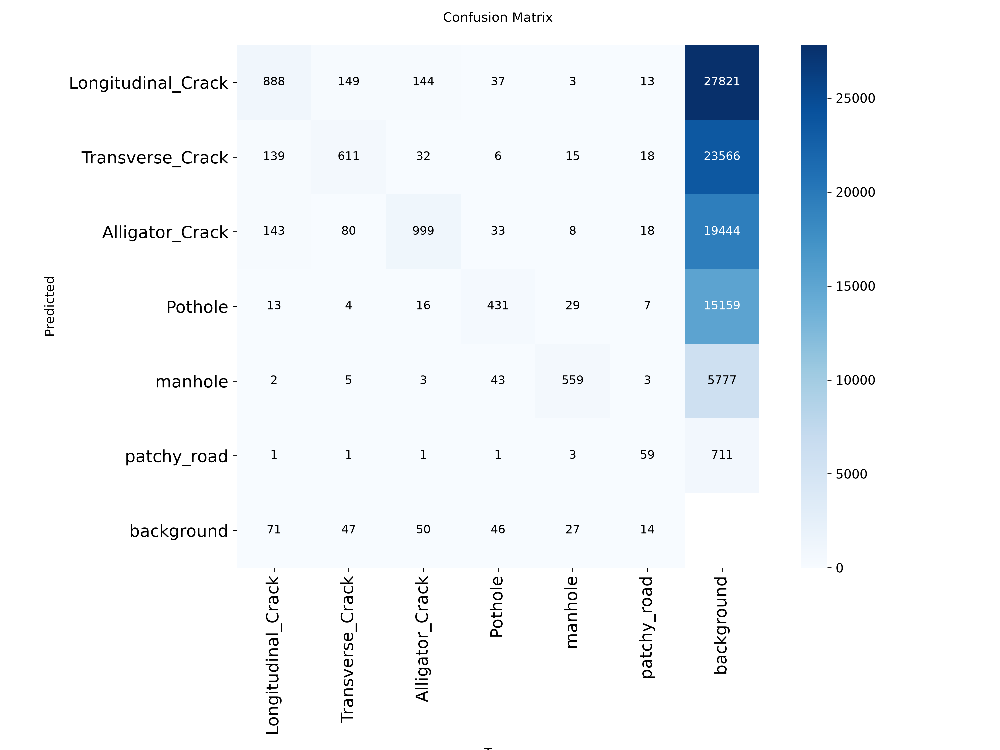

  val — confusion_matrix_normalized.png


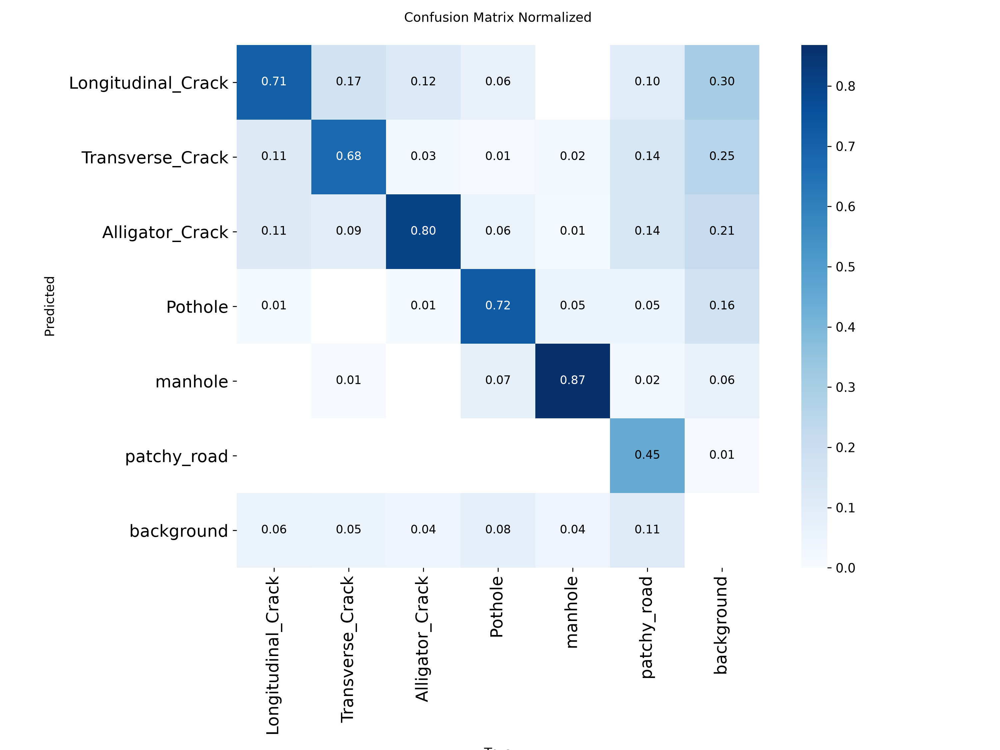

  test — confusion_matrix.png


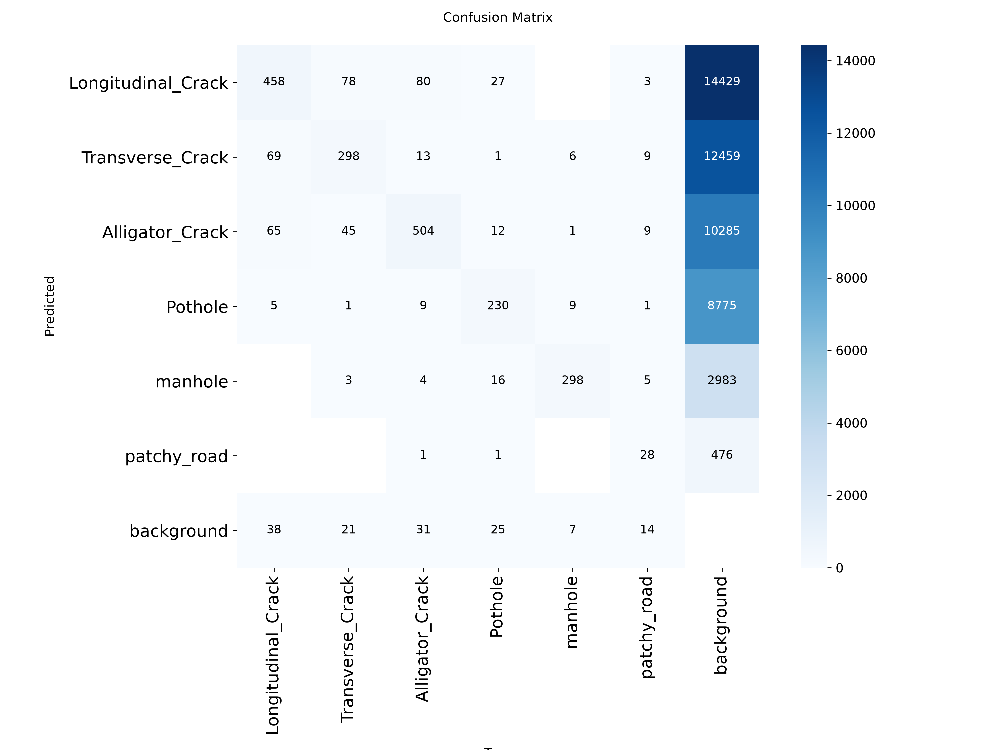

  test — confusion_matrix_normalized.png


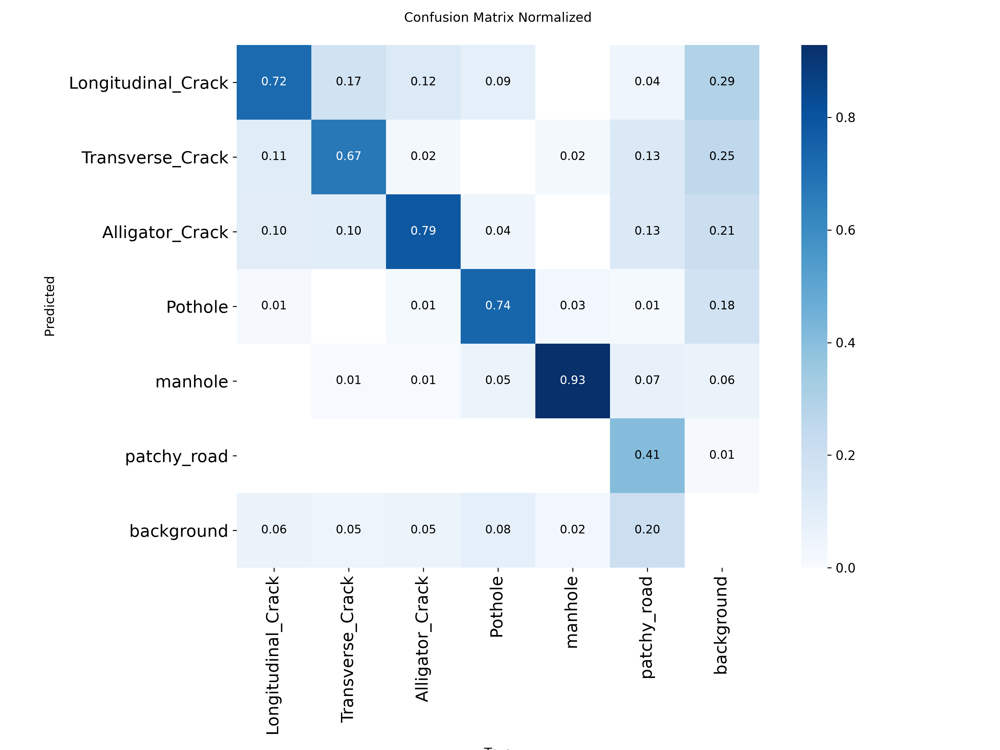


──────────────────────────────────────────────────
Model: yolov8_pd_class_weight
  val — confusion_matrix.png


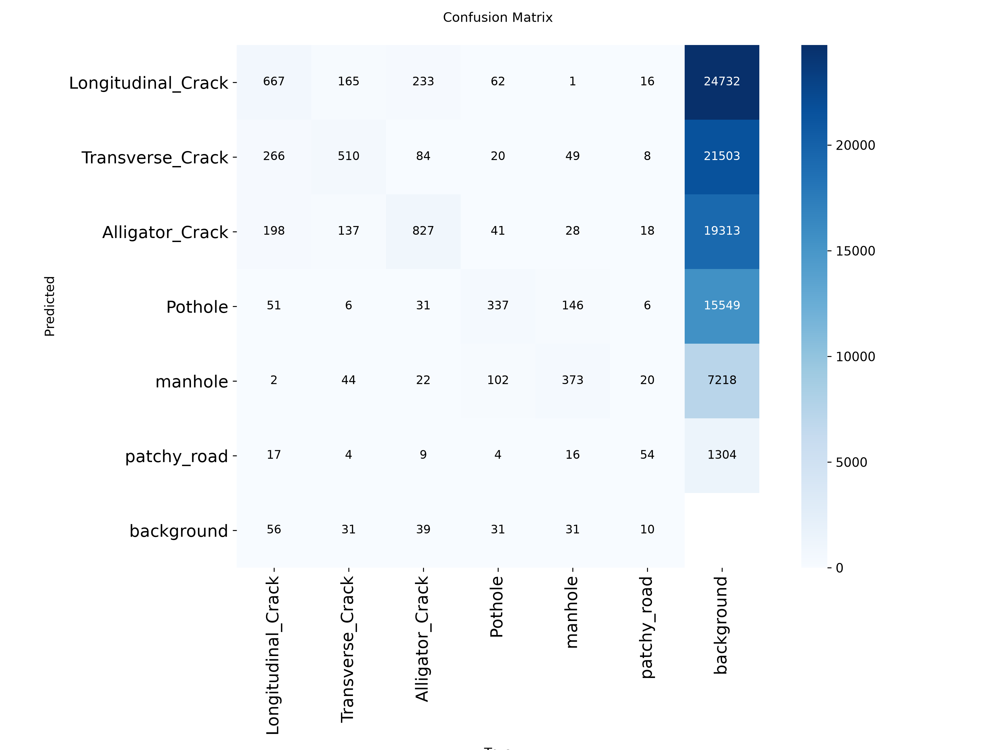

  val — confusion_matrix_normalized.png


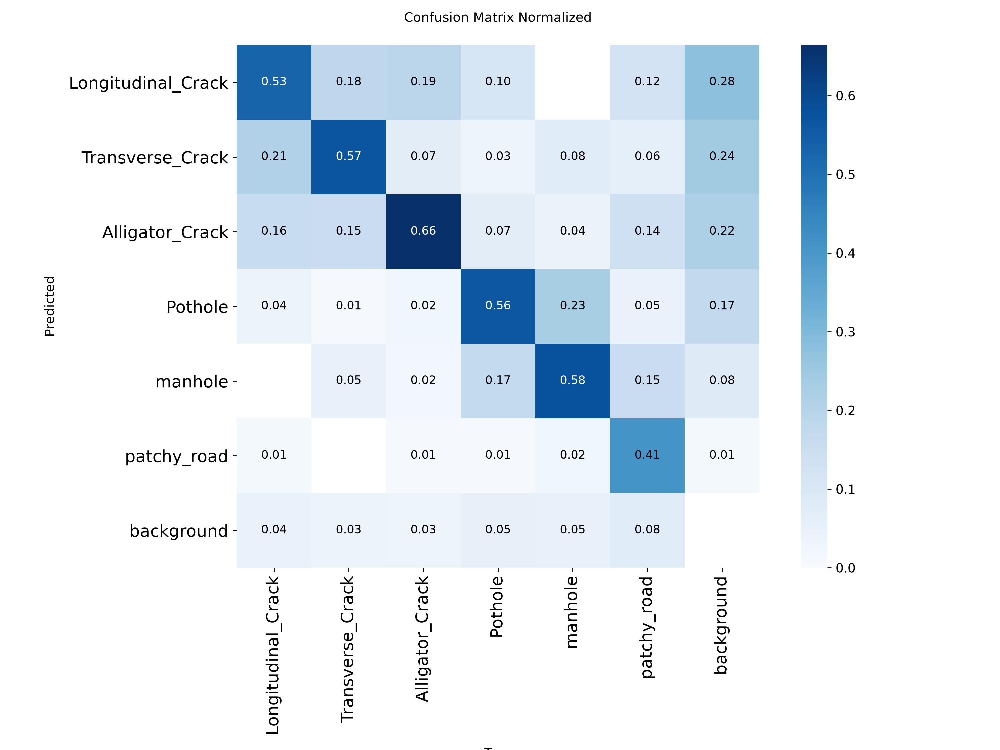

  test — confusion_matrix.png


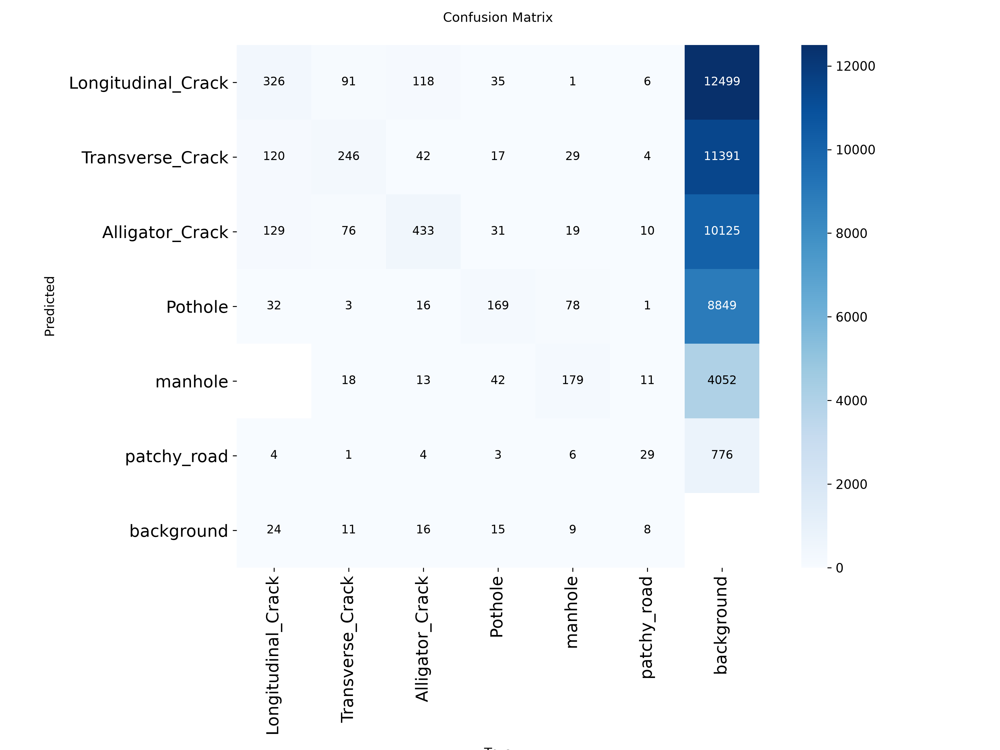

  test — confusion_matrix_normalized.png


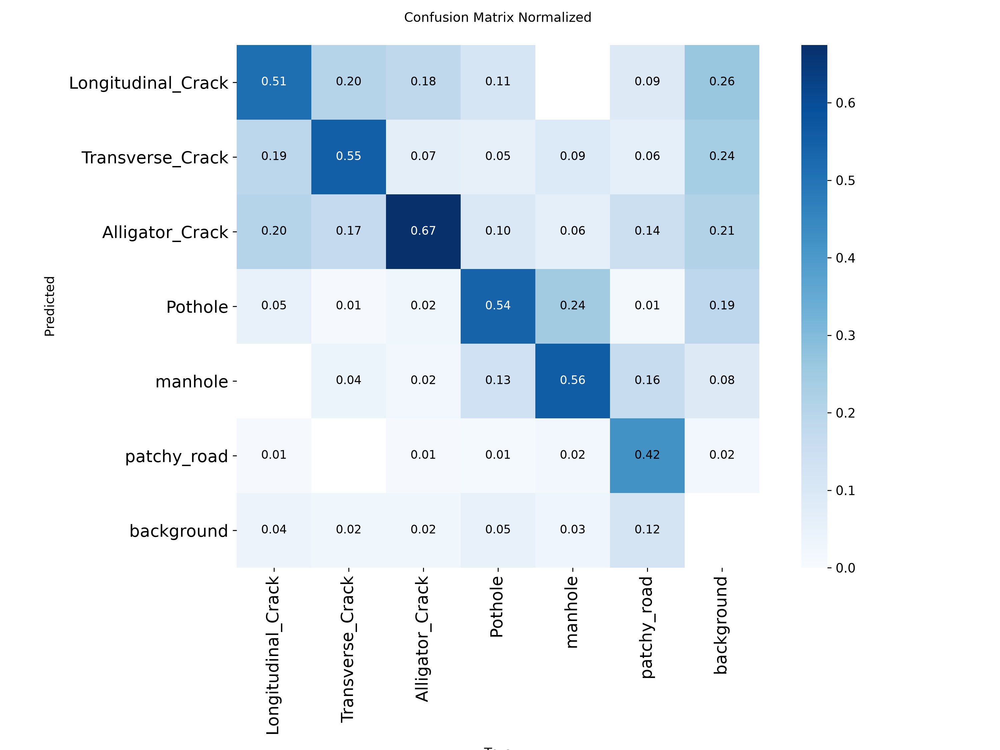


──────────────────────────────────────────────────
Model: yolo_rd_class_weight
  val — confusion_matrix.png


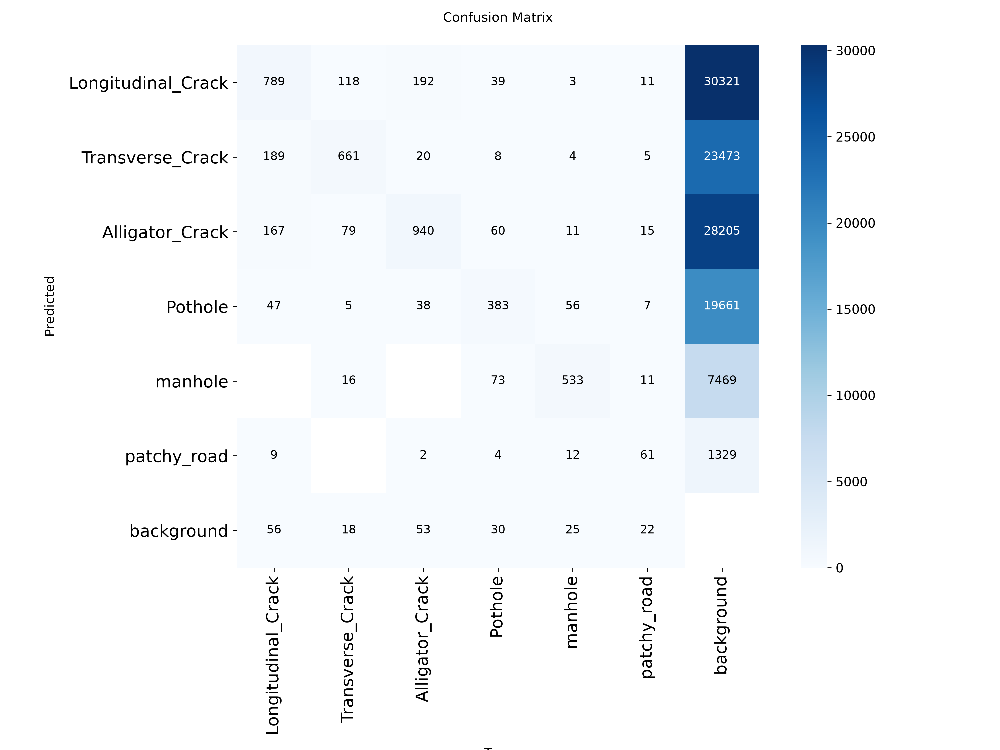

  val — confusion_matrix_normalized.png


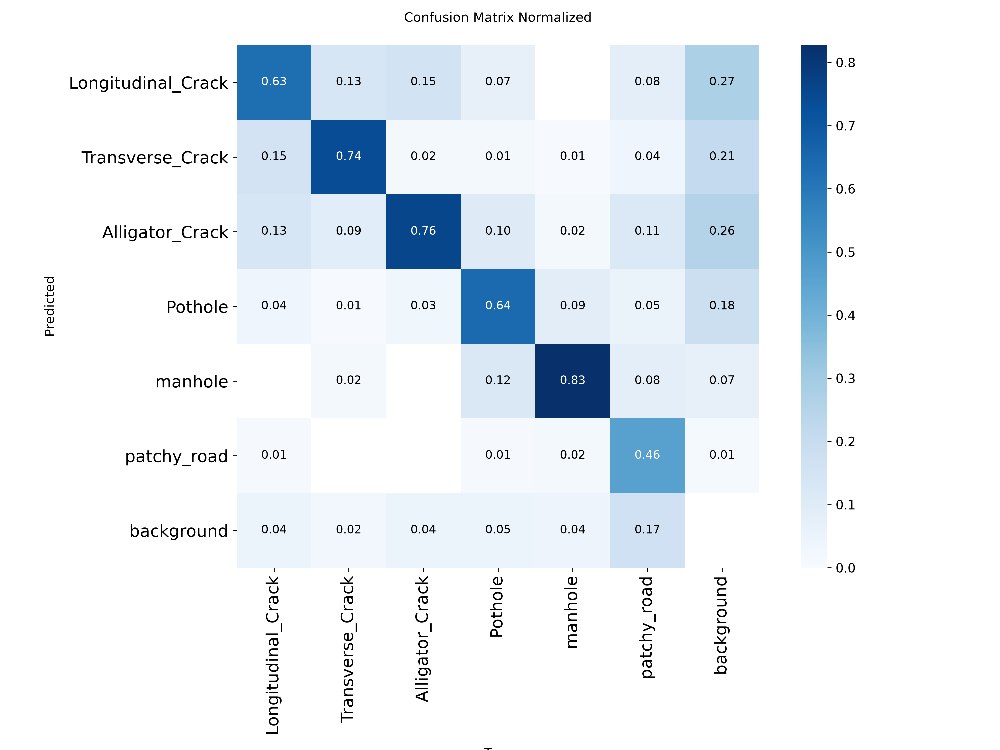

  test — confusion_matrix.png


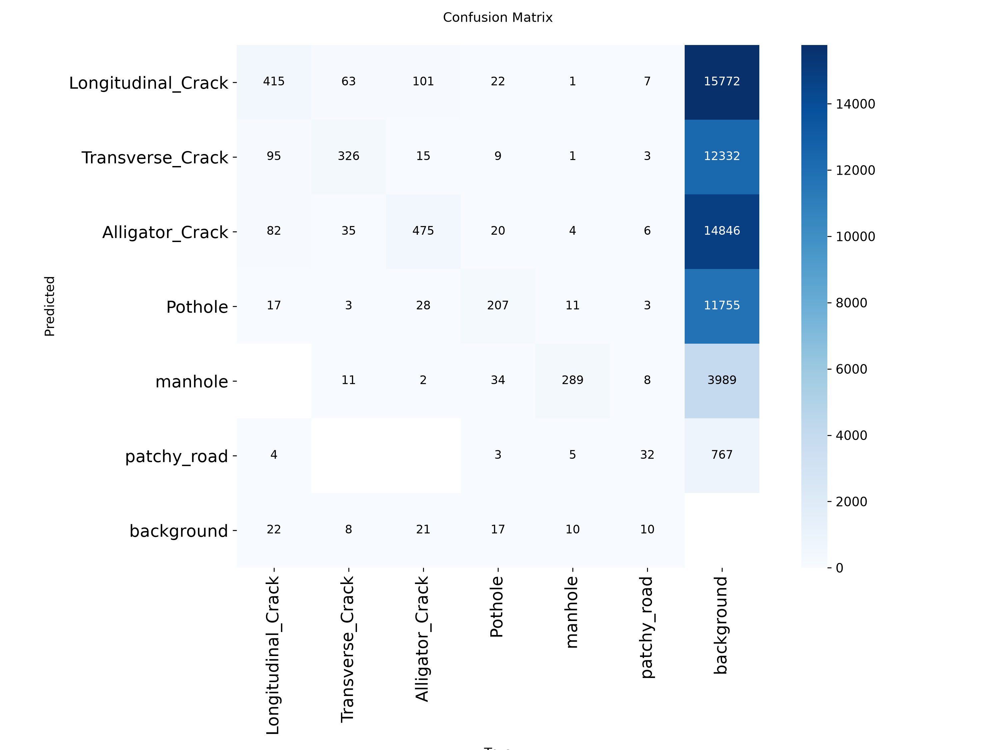

  test — confusion_matrix_normalized.png


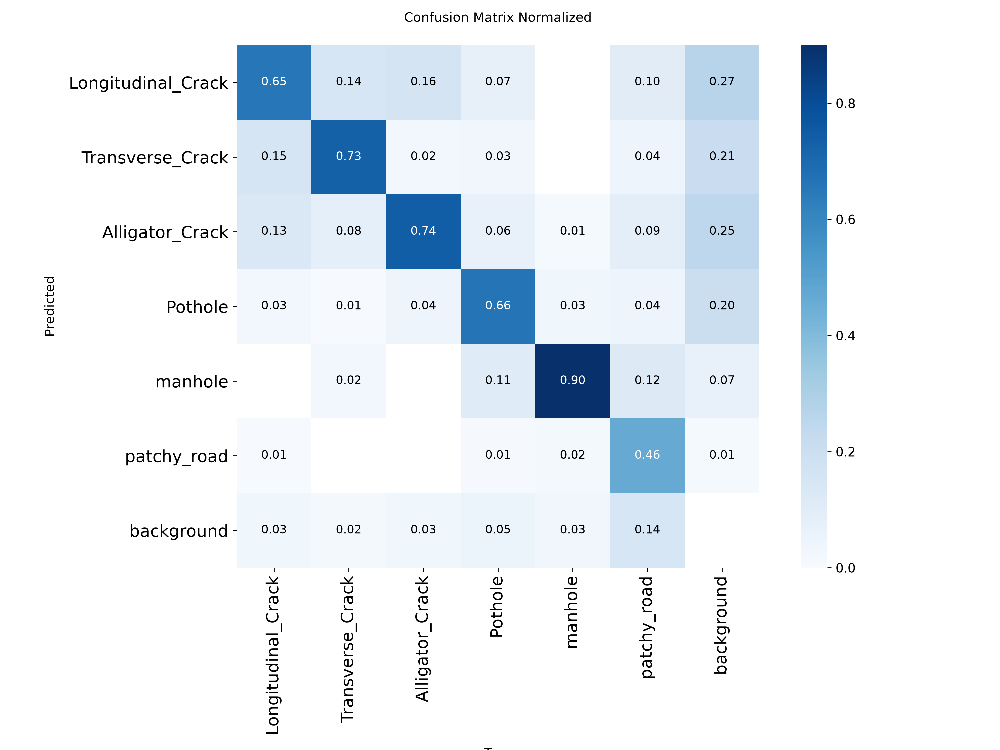

In [15]:
for model_name, run_name in trained_runs:
    print(f"\n{'─'*50}")
    print(f"Model: {model_name}")
    for split in ["val", "test"]:
        eval_subdir = EVAL_DIR / f"{model_name}_{split}"
        for plot_file in [
            "confusion_matrix.png",
            "confusion_matrix_normalized.png",
            "PR_curve.png",
            "F1_curve.png",
        ]:
            plot_path = eval_subdir / plot_file
            if plot_path.exists():
                print(f"  {split} — {plot_file}")
                display(Image(str(plot_path)))

### ***Prediksi Sampel Test per Model***


0: 640x640 1 manhole, 25.6ms
1: 640x640 1 Pothole, 25.6ms
2: 640x640 (no detections), 25.6ms
3: 640x640 1 Transverse_Crack, 25.6ms
4: 640x640 1 Pothole, 3 manholes, 25.6ms
5: 640x640 3 Alligator_Cracks, 25.6ms
Speed: 3.7ms preprocess, 25.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\predictions\yolov26n_class_weight_test_samples
5 labels saved to D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\predictions\yolov26n_class_weight_test_samples\labels

──────────────────────────────────────────────────
Model: yolov26n_class_weight — prediksi sampel test (PRED_CONF=0.25, PRED_IOU=0.6)


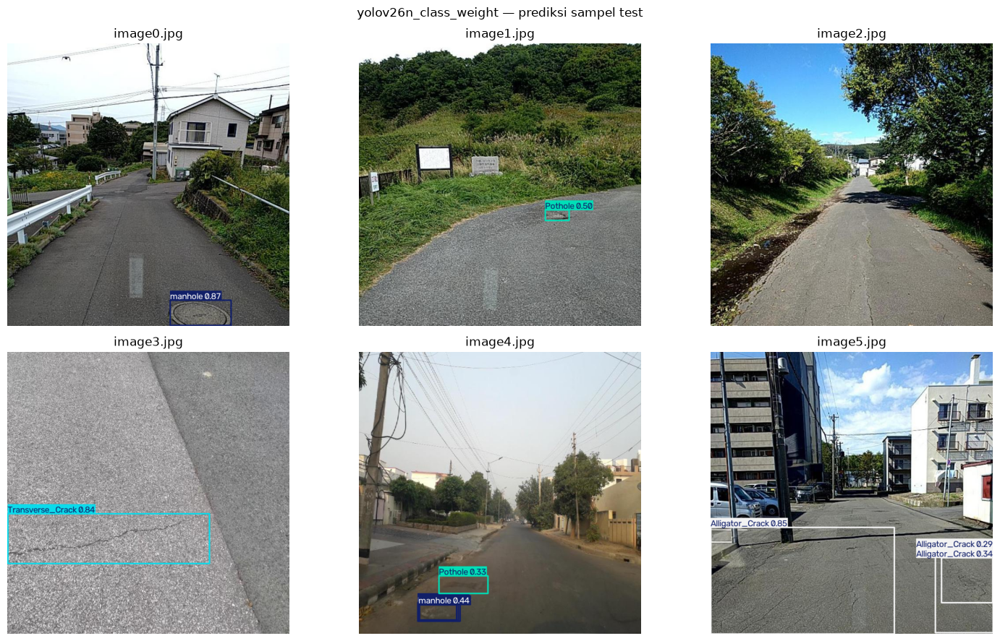


0: 640x640 1 manhole, 7.5ms
1: 640x640 1 Pothole, 7.5ms
2: 640x640 1 Alligator_Crack, 7.5ms
3: 640x640 1 Transverse_Crack, 7.5ms
4: 640x640 1 Pothole, 1 manhole, 7.5ms
5: 640x640 2 Alligator_Cracks, 1 Pothole, 7.5ms
Speed: 1.6ms preprocess, 7.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\predictions\yolov8_pd_class_weight_test_samples
6 labels saved to D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\predictions\yolov8_pd_class_weight_test_samples\labels

──────────────────────────────────────────────────
Model: yolov8_pd_class_weight — prediksi sampel test (PRED_CONF=0.25, PRED_IOU=0.6)


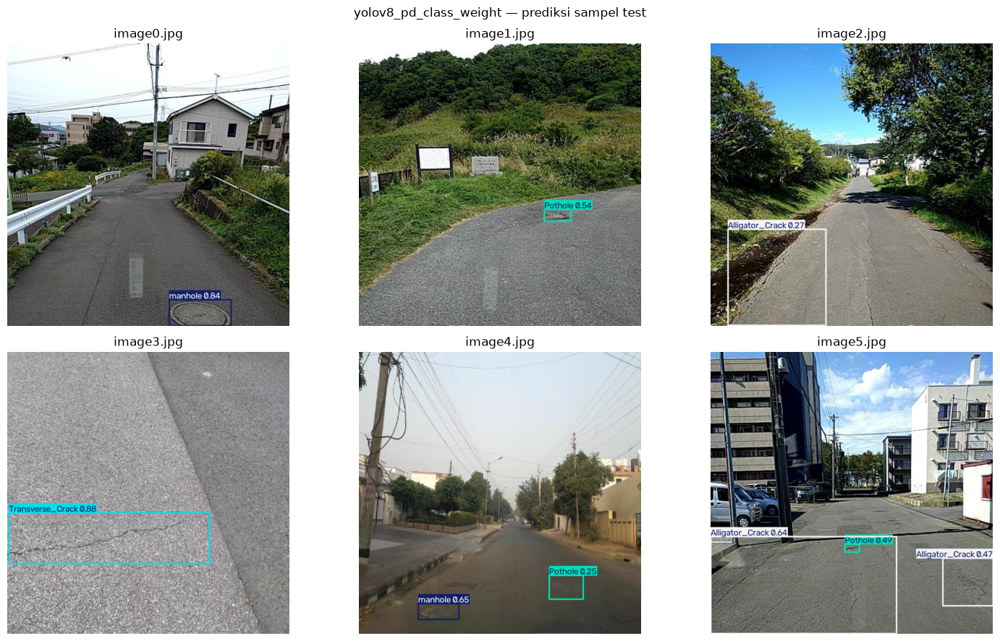


0: 640x640 1 manhole, 18.4ms
1: 640x640 1 Pothole, 18.4ms
2: 640x640 (no detections), 18.4ms
3: 640x640 1 Transverse_Crack, 18.4ms
4: 640x640 (no detections), 18.4ms
5: 640x640 2 Alligator_Cracks, 1 Pothole, 18.4ms
Speed: 2.4ms preprocess, 18.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\predictions\yolo_rd_class_weight_test_samples
4 labels saved to D:\Faaris\Project-TA\road-damage-detection-ta\runs\rdd_yolov8n_local\predictions\yolo_rd_class_weight_test_samples\labels

──────────────────────────────────────────────────
Model: yolo_rd_class_weight — prediksi sampel test (PRED_CONF=0.25, PRED_IOU=0.6)


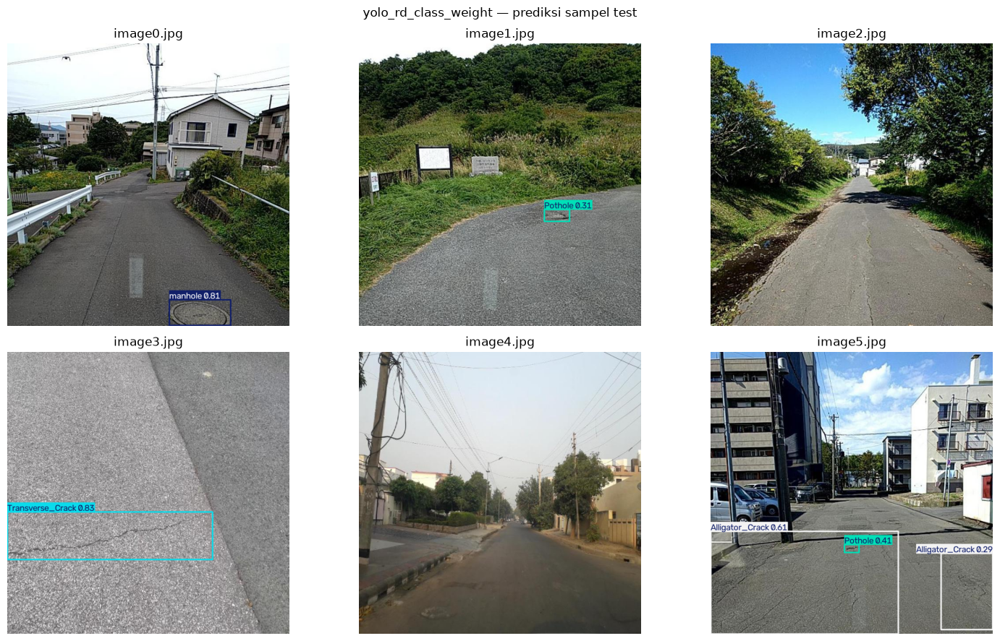

In [16]:
PREDICT_DIR   = OUTPUT_DIR / "predictions"
N_PRED_IMAGES = 6
test_images   = list_images("test")
sample_test   = random.sample(test_images, k=min(N_PRED_IMAGES, len(test_images)))

for model_name, run_name in trained_runs:
    best_weights = PROJECT_DIR / run_name / "weights/best.pt"
    best_model   = YOLO(str(best_weights))

    results = best_model.predict(
        source=[str(p) for p in sample_test],
        imgsz=IMGSZ,
        conf=PRED_CONF,
        iou=PRED_IOU,
        device=DEVICE,
        project=str(PREDICT_DIR),
        name=f"{model_name}_test_samples",
        exist_ok=True,
        save=True,
        save_txt=True,
        save_conf=True,
    )

    print(f"\n{'─'*50}")
    print(f"Model: {model_name} — prediksi sampel test ({PRED_CONF=}, {PRED_IOU=})")
    fig, axes = plt.subplots(2, 3, figsize=(15, 9))
    axes = axes.flatten()
    for ax, r in zip(axes, results):
        ax.imshow(r.plot()[:, :, ::-1])
        ax.set_title(Path(r.path).name[:45])
        ax.axis("off")
    for ax in axes[len(results):]:
        ax.axis("off")
    plt.suptitle(f"{model_name} — prediksi sampel test")
    plt.tight_layout()
    plt.show()

### ***Confidence Sweep (Opsional)***

In [17]:
RUN_CONFIDENCE_SWEEP = False
CONF_SWEEP = [0.10, 0.15, 0.20, 0.25, 0.30, 0.40, 0.50]

if RUN_CONFIDENCE_SWEEP:
    for model_name, run_name in trained_runs:
        best_weights = PROJECT_DIR / run_name / "weights/best.pt"
        best_model   = YOLO(str(best_weights))
        rows = []
        for conf in CONF_SWEEP:
            metrics = best_model.val(
                data=str(local_yaml),
                split="test",
                imgsz=IMGSZ,
                batch=BATCH,
                device=DEVICE,
                workers=WORKERS,
                project=str(EVAL_DIR),
                name=f"{model_name}_conf_{conf:.2f}".replace(".", "p"),
                exist_ok=True,
                plots=False,
                save_json=False,
                conf=conf,
                iou=EVAL_IOU,
                verbose=False,
            )
            rows.append({"model": model_name, "conf": conf, **{k: float(v) for k, v in metrics.results_dict.items()}})
        conf_sweep_df = pd.DataFrame(rows)
        display(conf_sweep_df)
        conf_sweep_df.to_csv(OUTPUT_DIR / f"{model_name}_confidence_sweep_test.csv", index=False)
else:
    print("Confidence sweep dilewati. Set RUN_CONFIDENCE_SWEEP=True jika ingin menjalankan.")

Confidence sweep dilewati. Set RUN_CONFIDENCE_SWEEP=True jika ingin menjalankan.


## ***Template Zero-Shot Bandung***

---

Jika data primer Bandung sudah diberi label YOLO, buat struktur berikut:

```
data/primary_bandung_yolo/
  data.yaml
  test/images/
  test/labels/
```

Lalu isi `PRIMARY_DATA_YAML`. Jika data primer belum berlabel, gunakan mode `predict` untuk inspeksi kualitatif.

In [18]:
PRIMARY_DATA_YAML  = REPO_ROOT / "data/primary_bandung_yolo/data.yaml"
PRIMARY_IMAGES_DIR = REPO_ROOT / "data/primary_bandung_yolo/images"

# Gunakan model terbaik (model pertama di trained_runs) untuk zero-shot.
# Ubah indeks jika ingin model yang berbeda.
if trained_runs:
    zs_model_name, zs_run_name = trained_runs[0]
    zs_weights = PROJECT_DIR / zs_run_name / "weights/best.pt"
    zs_model   = YOLO(str(zs_weights))

    if PRIMARY_DATA_YAML.exists():
        zero_shot_metrics = zs_model.val(
            data=str(PRIMARY_DATA_YAML),
            split="test",
            imgsz=IMGSZ,
            batch=BATCH,
            device=DEVICE,
            workers=WORKERS,
            project=str(EVAL_DIR),
            name=f"{zs_model_name}_zero_shot_bandung",
            exist_ok=True,
            plots=True,
            save_json=True,
            conf=EVAL_CONF,
            iou=EVAL_IOU,
        )
        print(zero_shot_metrics.results_dict)
    else:
        print(f"Belum ada data primer berlabel: {PRIMARY_DATA_YAML}")

    if PRIMARY_IMAGES_DIR.exists():
        bandung_images = sorted([p for p in PRIMARY_IMAGES_DIR.iterdir() if p.suffix.lower() in IMG_EXTS])
        if bandung_images:
            zs_model.predict(
                source=[str(p) for p in bandung_images[:50]],
                imgsz=IMGSZ,
                conf=PRED_CONF,
                iou=PRED_IOU,
                device=DEVICE,
                project=str(PREDICT_DIR),
                name=f"{zs_model_name}_zero_shot_bandung_unlabeled",
                exist_ok=True,
                save=True,
                save_txt=True,
                save_conf=True,
            )
            print(f"Prediksi zero-shot tersimpan di: {PREDICT_DIR / f'{zs_model_name}_zero_shot_bandung_unlabeled'}")
    else:
        print(f"Belum ada folder gambar primer tanpa label: {PRIMARY_IMAGES_DIR}")
else:
    print("trained_runs kosong — jalankan cell training terlebih dahulu.")

Belum ada data primer berlabel: D:\Faaris\Project-TA\road-damage-detection-ta\data\primary_bandung_yolo\data.yaml
Belum ada folder gambar primer tanpa label: D:\Faaris\Project-TA\road-damage-detection-ta\data\primary_bandung_yolo\images


## ***Output Penting untuk Laporan TA***

---

Setelah training dan evaluasi selesai, kumpulkan artefak berikut per model:

**Bobot terlatih**
- `runs/rdd_yolov8n_local/experiments/<model_name>/weights/best.pt`

**Ringkasan metrik**
- `runs/rdd_yolov8n_local/<model_name>_summary.json`
- `runs/rdd_yolov8n_local/<model_name>_f1_summary.csv`
- `runs/rdd_yolov8n_local/<model_name>_val_per_class_metrics.csv`
- `runs/rdd_yolov8n_local/<model_name>_test_per_class_metrics.csv`

**Dataset**
- `runs/rdd_yolov8n_local/dataset_class_distribution.csv`
- `runs/rdd_yolov8n_local/dataset_split_summary.csv`

**Plot evaluasi** (confusion matrix, PR curve, F1 curve)
- `runs/rdd_yolov8n_local/evaluation/<model_name>_val/`
- `runs/rdd_yolov8n_local/evaluation/<model_name>_test/`

**Prediksi sampel**
- `runs/rdd_yolov8n_local/predictions/<model_name>_test_samples/`